<a href="https://colab.research.google.com/github/sgc-aiml/DC-GAN-using-TPU/blob/main/GAN_for_TPU_on_mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Load the neccessary libraries

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds

import distutils
import time

import distutils
if distutils.version.LooseVersion(tf.__version__) < '1.14':
    raise Exception('This notebook is compatible with TensorFlow 1.14 or higher, for TensorFlow 1.13 or lower please use the previous version at https://github.com/tensorflow/tpu/blob/r1.13/tools/colab/fashion_mnist.ipynb')

import os


## Load the mnist data

In [ ]:
fig_shape = (28,28,1)
(mnist_learn_images, mnist_learn_labels), (mnist_test_images,mnist_test_labels) = tf.keras.datasets.mnist.load_data()


mnist_images = np.concatenate((mnist_learn_images,mnist_test_images),axis = 0)
mnist_labels = np.concatenate((mnist_learn_labels,mnist_test_labels),axis = 0)  
#randomly mix the images 
index = np.arange(mnist_images.shape[0])
np.random.shuffle(index)

# the images are saved as X
# add a new axis for CNN
# normalize the images between -1 to 1
X = (mnist_images[index,:,:,np.newaxis] - 127.5) / 127.5

##if you are interested in labels too.. use this 
Y = mnist_labels[index]

plotting a random image of number: 1


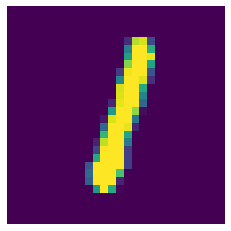

In [ ]:
import random
pos = random.randint(0,mnist_images.shape[0])
plt.axis("off")
# print(x[0])
plt.imshow(np.reshape(X[pos],(28,28)))
print("plotting a random image of number: "+str(Y[pos]))


##Make models

### make generator

In [ ]:
def make_generator(latent_dim=128):
  
  inputA = tf.keras.Input(shape=(latent_dim,))
  inputB = tf.keras.Input(shape=(10,))

  #gcomb = tf.keras.layers.Concatenate()([inputA,inputB])

  glayer = layers.Dense(7 * 7 * 128)(inputA)
  glayer = layers.Reshape((7, 7, 128))(glayer)
  glayer = layers.Conv2DTranspose(128, kernel_size=3, padding="same")(glayer)
  glayer = layers.LeakyReLU(alpha=0.2)(glayer)
  glayer = layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same")(glayer)
  glayer = layers.LeakyReLU(alpha=0.2)(glayer)
  glayer = layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same")(glayer)
  glayer = layers.LeakyReLU(alpha=0.2)(glayer)
  glayer = layers.Conv2D(1, kernel_size=5, padding="same", activation="tanh")(glayer)
  #generator = keras.models.Model(inputs=[inputA,inputB], outputs=glayer)
  generator = tf.keras.models.Model(inputs=inputA, outputs=glayer)  
  generator.summary()
  return generator

### make discriminator model



In [ ]:
def make_discriminator(fig_shape=(28,28,1)):
  dinputA = tf.keras.Input(shape=fig_shape)
  dlayer = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(dinputA)
  dlayer = layers.LeakyReLU(alpha=0.2)(dlayer)

  dlayer = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(dlayer)
  dlayer = layers.LeakyReLU(alpha=0.2)(dlayer)

  # dlayer = layers.Conv2D(128, kernel_size=3, strides=2, padding="same")(dlayer)
  # dlayer = layers.LeakyReLU(alpha=0.2)(dlayer)
  
  dlayer = layers.Flatten()(dlayer)
  dlayer = layers.Dropout(0.2)(dlayer)

  dlayer = layers.Dense(2000)(dlayer)
  dlayer = layers.LeakyReLU(alpha=0.2)(dlayer)
  dlayer = layers.Dropout(0.2)(dlayer)

  dlayer3= layers.Dense(1, activation="sigmoid")(dlayer)
  

  discriminator = tf.keras.models.Model(inputs=dinputA, outputs=dlayer3)


  discriminator.summary()
  return discriminator

### define the losses

In [ ]:
def discriminator_loss(real_output, fake_output,multiplier):
    
    #add random noise in the real label to improve the learning of GAN
    labels = tf.ones_like(real_output) - multiplier * tf.random.uniform(tf.shape(real_output))    
    
    real_loss = tf.nn.compute_average_loss(cross_entropy(labels, real_output), global_batch_size=GLOBAL_BATCH_SIZE)
    

    #add random noise in the fake label to improve the learning of GAN
    labels = tf.zeros_like(fake_output) + multiplier * tf.random.uniform(tf.shape(fake_output))
    
    fake_loss = tf.nn.compute_average_loss(cross_entropy(labels, fake_output), global_batch_size=GLOBAL_BATCH_SIZE)
    
    total_loss = real_loss + fake_loss
    return total_loss
def generator_loss(fake_output):
    return tf.nn.compute_average_loss(cross_entropy(tf.ones_like(fake_output), fake_output), global_batch_size=GLOBAL_BATCH_SIZE)

    

### define the train_step

In [ ]:
def train_step(inputs, multiplier=0.2):
    # images = images[0]
    images, labels = inputs
    BATCH_SIZE = len(images) # have same size of fake images as real images

    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    noise = tf.clip_by_value(noise,clip_value_min=-2.0, clip_value_max=2.0)

  


    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape, tf.GradientTape() as class_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)
      
      

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output,multiplier)
      
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return (gen_loss,disc_loss)

    
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(6, 6, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

##Define the strategy

In [ ]:
try:
  strategy == None
except:
  resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])
  tf.config.experimental_connect_to_cluster(resolver)
  # This is the TPU initialization code that has to be at the beginning.
  tf.tpu.experimental.initialize_tpu_system(resolver)
  print("All devices: ", tf.config.list_logical_devices('TPU'))

  # optimizer = tf.tpu.CrossShardOptimizer(tf.train.GradientDescentOptimizer(0.01))

  strategy = tf.distribute.TPUStrategy(resolver)


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: grpc://10.58.114.26:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.58.114.26:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]
INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


###Define models and losses within strategy

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense (Dense)               (None, 6272)              633472    
                                                                 
 reshape (Reshape)           (None, 7, 7, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 128)        147584    
 nspose)                                                         
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 7, 7, 128)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 14, 14, 128)      147584    
 ranspose)                                                   

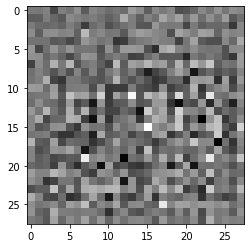

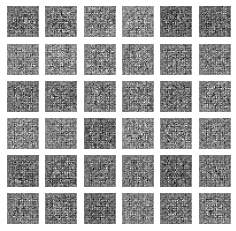

class values from decision model for the above picture is tf.Tensor(
[[0.49988452]
 [0.50011224]
 [0.49975473]
 [0.4999602 ]
 [0.50003827]
 [0.5001633 ]
 [0.49967232]
 [0.49977344]
 [0.4997928 ]
 [0.5001049 ]
 [0.49969852]
 [0.4999492 ]
 [0.50000864]
 [0.5001116 ]
 [0.49992588]
 [0.50012845]
 [0.49991602]
 [0.49984232]
 [0.5001168 ]
 [0.49994677]
 [0.4999037 ]
 [0.49990222]
 [0.5000477 ]
 [0.49970487]
 [0.5002133 ]
 [0.5000288 ]
 [0.5003372 ]
 [0.5002673 ]
 [0.5004344 ]
 [0.4998966 ]
 [0.500155  ]
 [0.4995294 ]
 [0.4999848 ]
 [0.50027055]
 [0.50005317]
 [0.4999174 ]], shape=(36, 1), dtype=float32)
models are made and ready to training


In [ ]:

with strategy.scope():
  

  LATENT_COUNT = 100 

  EPOCHS = 300
  noise_dim = LATENT_COUNT
  num_examples_to_generate = 36

  BUFFER_SIZE = len(Y) #get the actual buffer size from label_data

  BATCH_SIZE_PER_REPLICA = 256
  GLOBAL_BATCH_SIZE = BATCH_SIZE_PER_REPLICA * strategy.num_replicas_in_sync
  BATCH_SIZE = GLOBAL_BATCH_SIZE

  loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
      from_logits=True,
      reduction=tf.keras.losses.Reduction.NONE)
  

  # You will reuse this seed overtime (so it's easier)
  # to visualize progress in the animated GIF)

  noise = tf.random.normal([num_examples_to_generate, noise_dim])
  seed = tf.clip_by_value(noise,clip_value_min=-2.0, clip_value_max=2.0)

  #create the model and test them randomly
  generator = make_generator(LATENT_COUNT)
  discriminator = make_discriminator()

  generated_image = generator(seed, training=False)

  plt.imshow(generated_image[0, :, :, 0], cmap='gray')
  decision = discriminator(generated_image)
  generate_and_save_images(generator, 0, seed)
  print ("class values from decision model for the above picture is " + str(decision))  
  
  # Batch and shuffle the data
  train_dataset = tf.data.Dataset.from_tensor_slices((X,Y)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
  train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)

  #creating the loss functions and optimizers
  cross_entropy = tf.keras.losses.BinaryCrossentropy(reduction=tf.keras.losses.Reduction.NONE)#.SUM_OVER_BATCH_SIZE#SUM
  generator_optimizer = tf.keras.optimizers.Adam(1e-4)
  discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
  checkpoint_dir = './training_checkpoints'
  checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
  checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
  
print('models are made and ready to training')


##Train the data

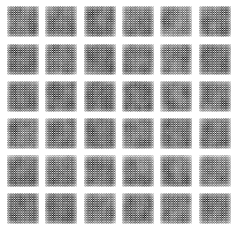

Epoch 1, Gen Loss: 0.11605899035930634, Disc Loss: 0.09061523526906967, time: 30.161556720733643


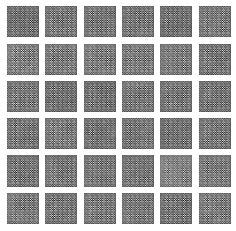

Epoch 2, Gen Loss: 0.13802982866764069, Disc Loss: 0.05710995942354202, time: 5.784799337387085


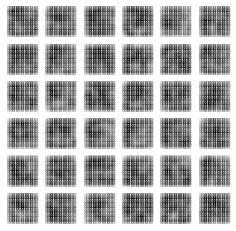

Epoch 3, Gen Loss: 0.2728632092475891, Disc Loss: 0.02368302457034588, time: 6.687180042266846


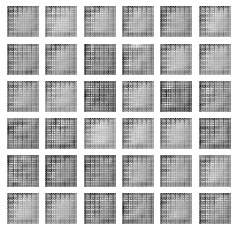

Epoch 4, Gen Loss: 0.3705286979675293, Disc Loss: 0.008058987557888031, time: 5.793301343917847


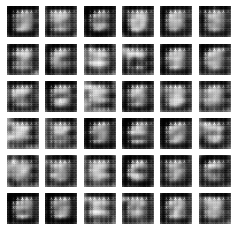

Epoch 5, Gen Loss: 0.46476179361343384, Disc Loss: 0.01614813134074211, time: 6.517127513885498


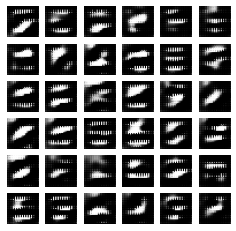

Epoch 6, Gen Loss: 0.6445204019546509, Disc Loss: 0.037068162113428116, time: 5.737138032913208


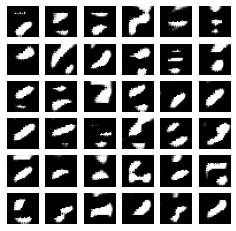

Epoch 7, Gen Loss: 0.5040251016616821, Disc Loss: 0.057753290981054306, time: 6.237300157546997


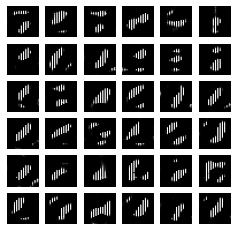

Epoch 8, Gen Loss: 0.4897705018520355, Disc Loss: 0.0658838301897049, time: 5.933024883270264


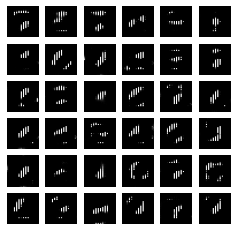

Epoch 9, Gen Loss: 0.7840274572372437, Disc Loss: 0.0011569301132112741, time: 6.306346654891968


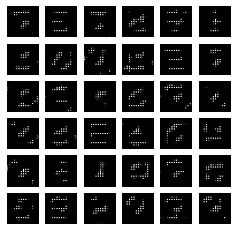

Epoch 10, Gen Loss: 0.6991650462150574, Disc Loss: 0.0029736850410699844, time: 7.639974355697632


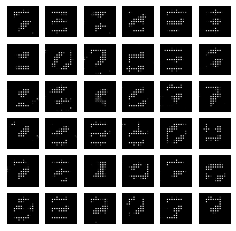

Epoch 11, Gen Loss: 0.7231402397155762, Disc Loss: 0.002024924149736762, time: 6.85982608795166


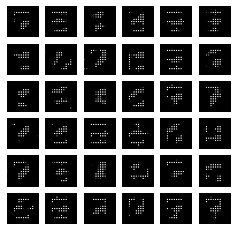

Epoch 12, Gen Loss: 0.8284357786178589, Disc Loss: 0.0006831089267507195, time: 6.260227918624878


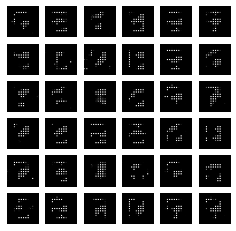

Epoch 13, Gen Loss: 0.8689013719558716, Disc Loss: 0.000444695440819487, time: 7.205421209335327


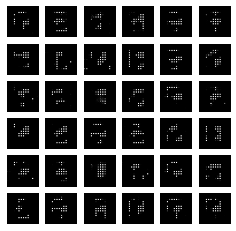

Epoch 14, Gen Loss: 0.8985502123832703, Disc Loss: 0.0003025582409463823, time: 5.70047664642334


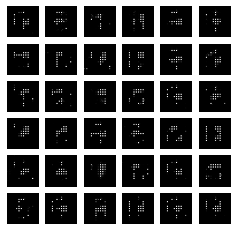

Epoch 15, Gen Loss: 0.9147621989250183, Disc Loss: 0.0003156274033244699, time: 6.316222429275513


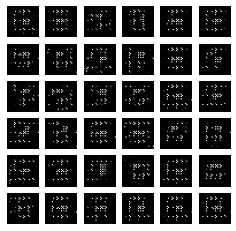

Epoch 16, Gen Loss: 0.8630274534225464, Disc Loss: 0.00033615296706557274, time: 5.781508445739746


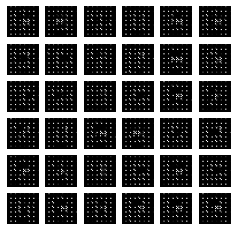

Epoch 17, Gen Loss: 0.8278982639312744, Disc Loss: 0.0007437446038238704, time: 5.830655097961426


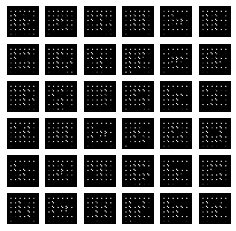

Epoch 18, Gen Loss: 0.9429383277893066, Disc Loss: 0.00016677843814250082, time: 6.930576801300049


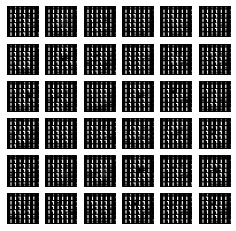

Epoch 19, Gen Loss: 0.8708212375640869, Disc Loss: 0.010034220293164253, time: 6.378812074661255


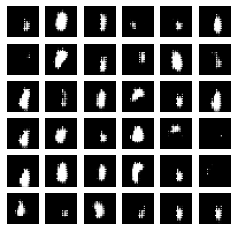

Epoch 20, Gen Loss: 1.2483570575714111, Disc Loss: 0.021204005926847458, time: 8.732450485229492


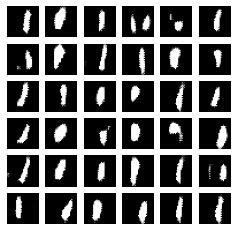

Epoch 21, Gen Loss: 0.5303208827972412, Disc Loss: 0.05840986222028732, time: 9.786903142929077


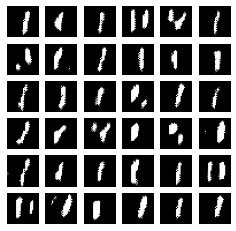

Epoch 22, Gen Loss: 0.44326797127723694, Disc Loss: 0.05016941577196121, time: 8.729585647583008


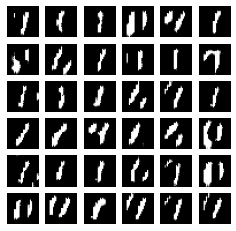

Epoch 23, Gen Loss: 0.37019625306129456, Disc Loss: 0.05741334706544876, time: 6.754589080810547


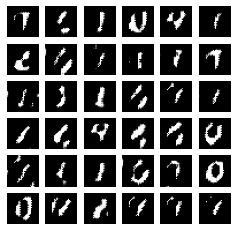

Epoch 24, Gen Loss: 0.40356209874153137, Disc Loss: 0.04674387350678444, time: 5.787805795669556


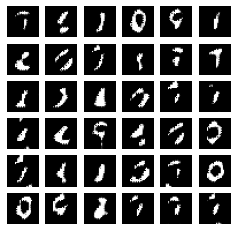

Epoch 25, Gen Loss: 0.3458026647567749, Disc Loss: 0.06899119913578033, time: 6.485958099365234


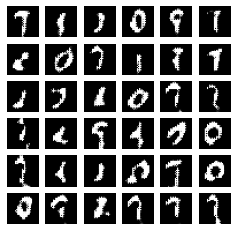

Epoch 26, Gen Loss: 0.25447899103164673, Disc Loss: 0.09290565550327301, time: 5.768700838088989


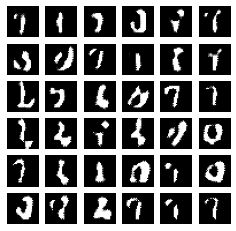

Epoch 27, Gen Loss: 0.3848981261253357, Disc Loss: 0.039997633546590805, time: 6.417993068695068


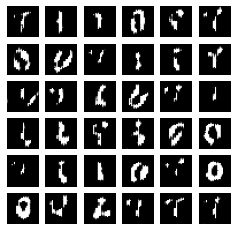

Epoch 28, Gen Loss: 0.3762485682964325, Disc Loss: 0.05606408789753914, time: 5.8422369956970215


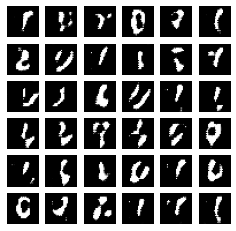

Epoch 29, Gen Loss: 0.36021196842193604, Disc Loss: 0.06915994733572006, time: 6.426858901977539


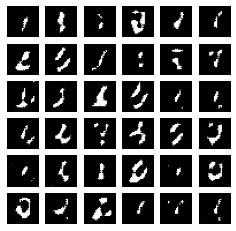

Epoch 30, Gen Loss: 0.3455386459827423, Disc Loss: 0.054617688059806824, time: 5.765314817428589


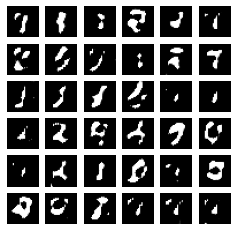

Epoch 31, Gen Loss: 0.41895341873168945, Disc Loss: 0.03894885256886482, time: 6.285073757171631


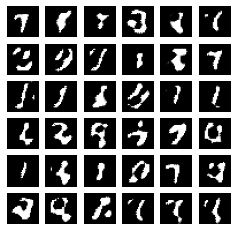

Epoch 32, Gen Loss: 0.430399626493454, Disc Loss: 0.04316478967666626, time: 5.839816570281982


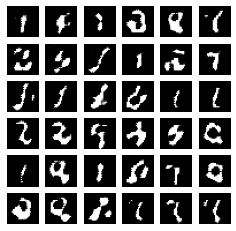

Epoch 33, Gen Loss: 0.40039440989494324, Disc Loss: 0.04387287423014641, time: 6.202015161514282


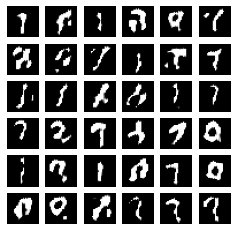

Epoch 34, Gen Loss: 0.49339795112609863, Disc Loss: 0.033120255917310715, time: 5.71247124671936


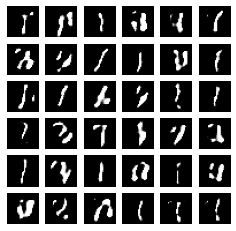

Epoch 35, Gen Loss: 0.4897841215133667, Disc Loss: 0.0428793765604496, time: 6.206768035888672


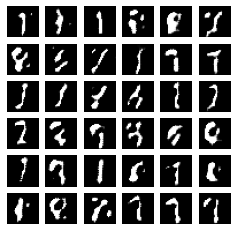

Epoch 36, Gen Loss: 0.35556134581565857, Disc Loss: 0.06095151975750923, time: 5.829777956008911


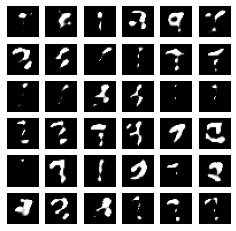

Epoch 37, Gen Loss: 0.47475993633270264, Disc Loss: 0.03373577073216438, time: 7.0249950885772705


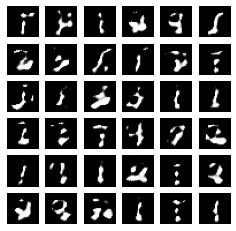

Epoch 38, Gen Loss: 0.39296114444732666, Disc Loss: 0.054389793425798416, time: 5.796794414520264


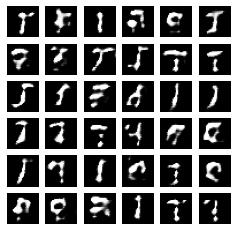

Epoch 39, Gen Loss: 0.31851720809936523, Disc Loss: 0.08550228923559189, time: 6.535569429397583


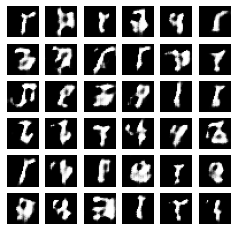

Epoch 40, Gen Loss: 0.2928426265716553, Disc Loss: 0.10642458498477936, time: 6.084958553314209


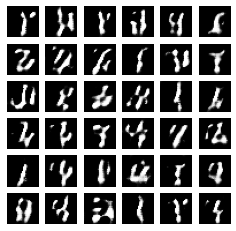

Epoch 41, Gen Loss: 0.31309929490089417, Disc Loss: 0.06936900317668915, time: 6.342793941497803


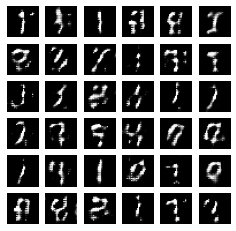

Epoch 42, Gen Loss: 0.21094463765621185, Disc Loss: 0.1222323551774025, time: 5.711557865142822


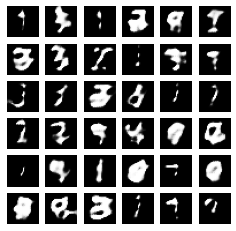

Epoch 43, Gen Loss: 0.3053537905216217, Disc Loss: 0.05229547992348671, time: 6.3708555698394775


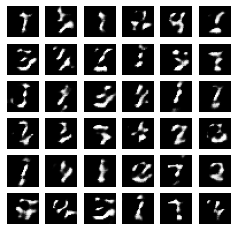

Epoch 44, Gen Loss: 0.2582767903804779, Disc Loss: 0.12473791837692261, time: 5.791130542755127


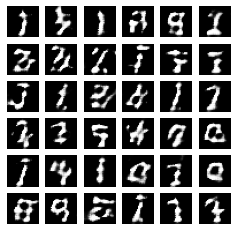

Epoch 45, Gen Loss: 0.2993992567062378, Disc Loss: 0.07267336547374725, time: 6.19961404800415


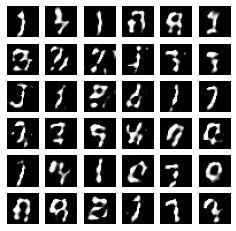

Epoch 46, Gen Loss: 0.23600417375564575, Disc Loss: 0.09132176637649536, time: 5.731260538101196


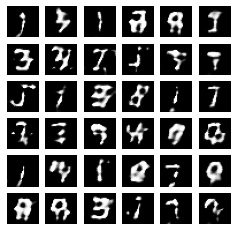

Epoch 47, Gen Loss: 0.28947874903678894, Disc Loss: 0.06330527365207672, time: 6.495099782943726


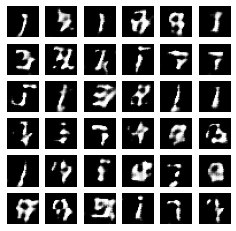

Epoch 48, Gen Loss: 0.22988036274909973, Disc Loss: 0.10610346496105194, time: 5.674055099487305


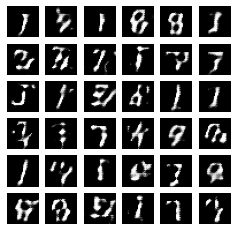

Epoch 49, Gen Loss: 0.2760671377182007, Disc Loss: 0.07212215662002563, time: 6.67778468132019


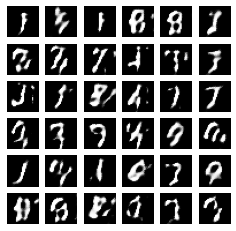

Epoch 50, Gen Loss: 0.23206467926502228, Disc Loss: 0.09758907556533813, time: 6.657458543777466


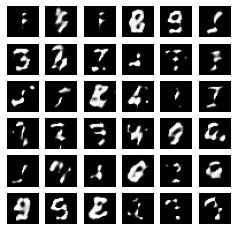

Epoch 51, Gen Loss: 0.26297932863235474, Disc Loss: 0.06573116779327393, time: 5.7251598834991455


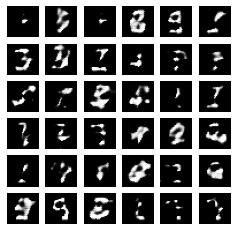

Epoch 52, Gen Loss: 0.276790976524353, Disc Loss: 0.07970591634511948, time: 6.442979574203491


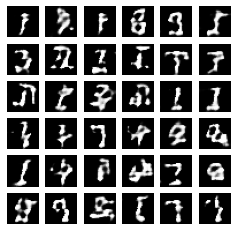

Epoch 53, Gen Loss: 0.27159637212753296, Disc Loss: 0.08267918974161148, time: 5.771179914474487


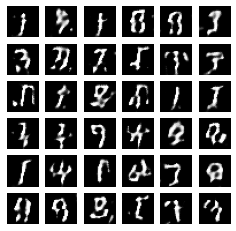

Epoch 54, Gen Loss: 0.2979619801044464, Disc Loss: 0.07743782550096512, time: 5.807129621505737


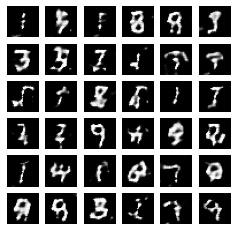

Epoch 55, Gen Loss: 0.19331657886505127, Disc Loss: 0.09920203685760498, time: 6.448263645172119


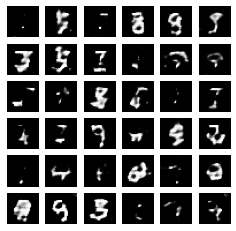

Epoch 56, Gen Loss: 0.24215899407863617, Disc Loss: 0.06765500456094742, time: 6.146045446395874


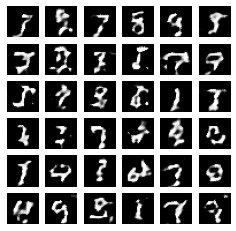

Epoch 57, Gen Loss: 0.30989870429039, Disc Loss: 0.0743216946721077, time: 6.586023807525635


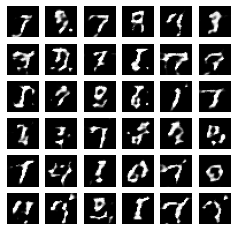

Epoch 58, Gen Loss: 0.2811214029788971, Disc Loss: 0.07732239365577698, time: 6.531188488006592


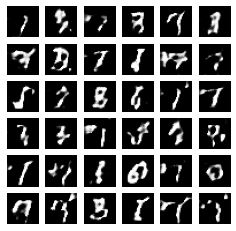

Epoch 59, Gen Loss: 0.25685781240463257, Disc Loss: 0.076119065284729, time: 5.805174112319946


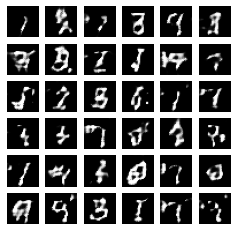

Epoch 60, Gen Loss: 0.26449257135391235, Disc Loss: 0.07034115493297577, time: 6.402193307876587


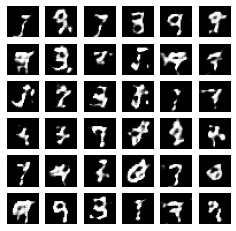

Epoch 61, Gen Loss: 0.2903806269168854, Disc Loss: 0.07351212203502655, time: 5.7299487590789795


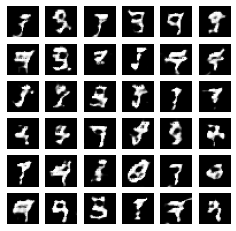

Epoch 62, Gen Loss: 0.26513734459877014, Disc Loss: 0.08280612528324127, time: 6.154239177703857


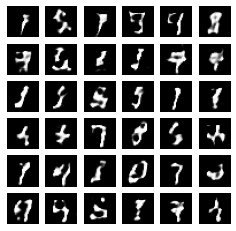

Epoch 63, Gen Loss: 0.26931312680244446, Disc Loss: 0.07971435785293579, time: 5.757387638092041


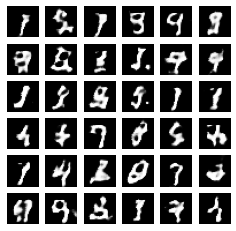

Epoch 64, Gen Loss: 0.2618960440158844, Disc Loss: 0.0748390257358551, time: 6.580238342285156


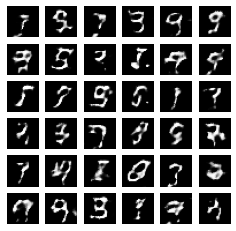

Epoch 65, Gen Loss: 0.25657057762145996, Disc Loss: 0.08721090853214264, time: 5.983031272888184


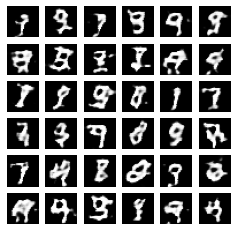

Epoch 66, Gen Loss: 0.28580719232559204, Disc Loss: 0.06600074470043182, time: 6.280494928359985


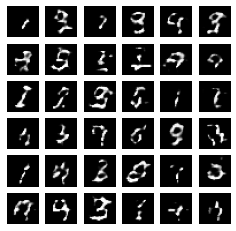

Epoch 67, Gen Loss: 0.25269418954849243, Disc Loss: 0.09245365858078003, time: 5.7735278606414795


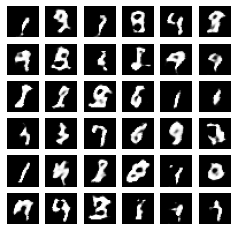

Epoch 68, Gen Loss: 0.26909705996513367, Disc Loss: 0.08015130460262299, time: 6.124274015426636


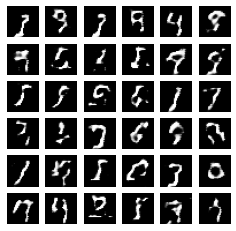

Epoch 69, Gen Loss: 0.2603442072868347, Disc Loss: 0.10017833113670349, time: 5.763324022293091


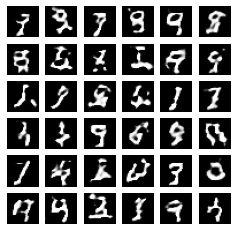

Epoch 70, Gen Loss: 0.3310032784938812, Disc Loss: 0.05517848953604698, time: 6.238814115524292


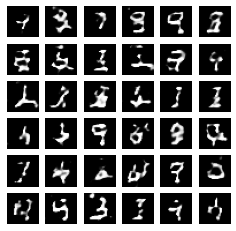

Epoch 71, Gen Loss: 0.2511579990386963, Disc Loss: 0.08322719484567642, time: 5.769102334976196


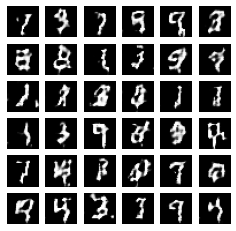

Epoch 72, Gen Loss: 0.26347780227661133, Disc Loss: 0.08366015553474426, time: 6.200556755065918


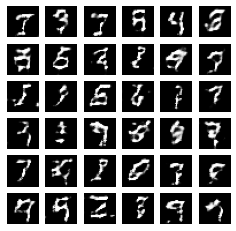

Epoch 73, Gen Loss: 0.3548445999622345, Disc Loss: 0.06391999125480652, time: 5.697108507156372


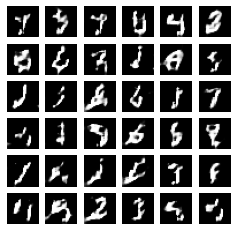

Epoch 74, Gen Loss: 0.32503122091293335, Disc Loss: 0.0844002217054367, time: 6.431278467178345


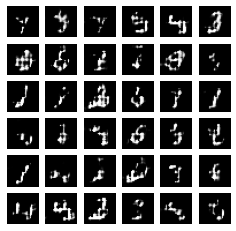

Epoch 75, Gen Loss: 0.2552435100078583, Disc Loss: 0.09939875453710556, time: 5.787047386169434


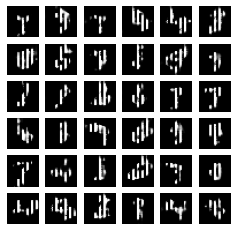

Epoch 76, Gen Loss: 0.40992847084999084, Disc Loss: 0.03641590103507042, time: 6.450613975524902


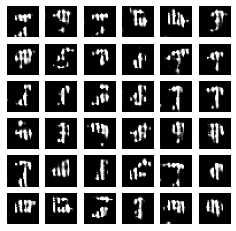

Epoch 77, Gen Loss: 0.39080801606178284, Disc Loss: 0.10662034153938293, time: 5.7380993366241455


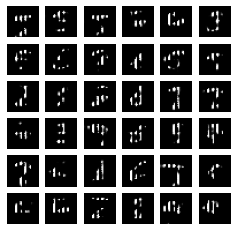

Epoch 78, Gen Loss: 0.5555820465087891, Disc Loss: 0.02828201651573181, time: 6.449218034744263


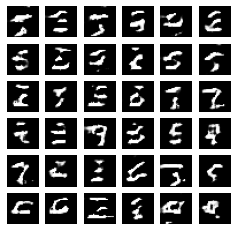

Epoch 79, Gen Loss: 0.5799822807312012, Disc Loss: 0.025201627984642982, time: 5.797326564788818


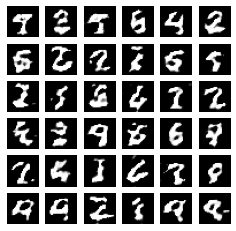

Epoch 80, Gen Loss: 0.34457048773765564, Disc Loss: 0.07180775701999664, time: 6.332382917404175


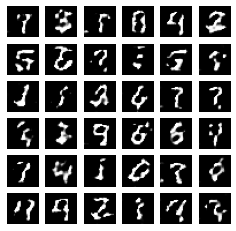

Epoch 81, Gen Loss: 0.2770243287086487, Disc Loss: 0.07904088497161865, time: 5.769538640975952


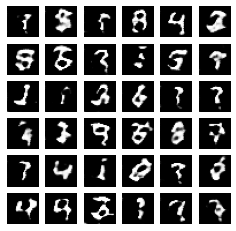

Epoch 82, Gen Loss: 0.3091655671596527, Disc Loss: 0.057154204696416855, time: 6.424190282821655


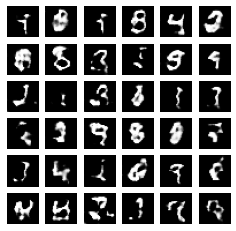

Epoch 83, Gen Loss: 0.3201475441455841, Disc Loss: 0.05971510708332062, time: 5.913011074066162


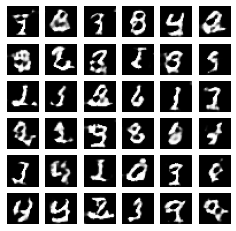

Epoch 84, Gen Loss: 0.28299349546432495, Disc Loss: 0.07684987783432007, time: 6.55637264251709


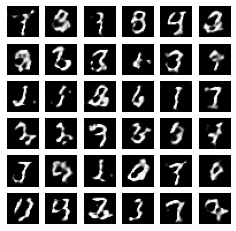

Epoch 85, Gen Loss: 0.2897501587867737, Disc Loss: 0.071909099817276, time: 5.830930709838867


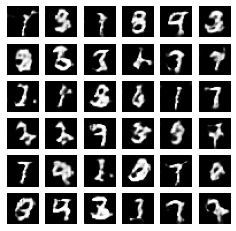

Epoch 86, Gen Loss: 0.23099112510681152, Disc Loss: 0.08347824960947037, time: 6.144124984741211


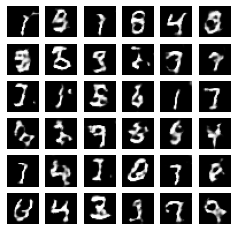

Epoch 87, Gen Loss: 0.24970939755439758, Disc Loss: 0.0845375806093216, time: 5.781088352203369


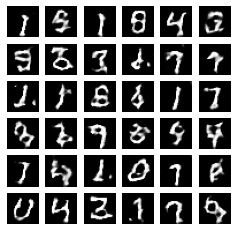

Epoch 88, Gen Loss: 0.24885374307632446, Disc Loss: 0.08734691888093948, time: 6.365333795547485


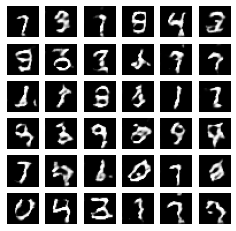

Epoch 89, Gen Loss: 0.24259859323501587, Disc Loss: 0.08463617414236069, time: 6.436022996902466


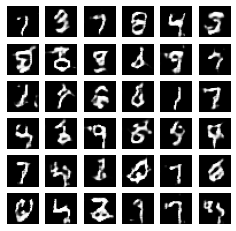

Epoch 90, Gen Loss: 0.2869236171245575, Disc Loss: 0.07242308557033539, time: 7.106362581253052


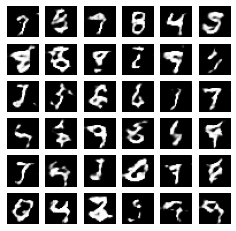

Epoch 91, Gen Loss: 0.27149999141693115, Disc Loss: 0.09148553758859634, time: 6.253534555435181


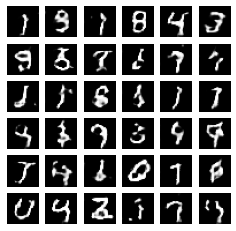

Epoch 92, Gen Loss: 0.23919010162353516, Disc Loss: 0.10295354574918747, time: 5.709872484207153


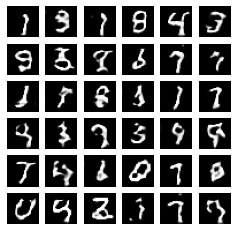

Epoch 93, Gen Loss: 0.2617364823818207, Disc Loss: 0.07047411799430847, time: 6.192846298217773


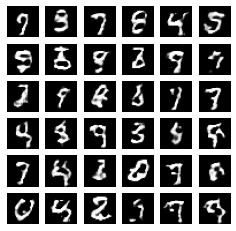

Epoch 94, Gen Loss: 0.25030452013015747, Disc Loss: 0.09389601647853851, time: 5.625327110290527


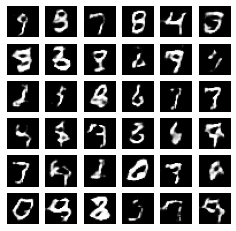

Epoch 95, Gen Loss: 0.2345297932624817, Disc Loss: 0.08745358884334564, time: 6.318042278289795


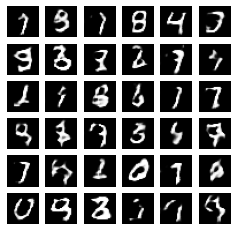

Epoch 96, Gen Loss: 0.25141674280166626, Disc Loss: 0.08296845853328705, time: 5.757229804992676


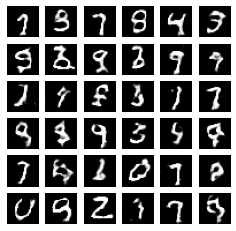

Epoch 97, Gen Loss: 0.22750136256217957, Disc Loss: 0.10009714215993881, time: 6.363446950912476


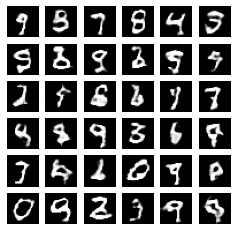

Epoch 98, Gen Loss: 0.2459735870361328, Disc Loss: 0.08386068791151047, time: 5.9528093338012695


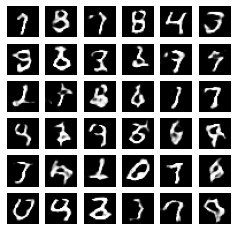

Epoch 99, Gen Loss: 0.2520821690559387, Disc Loss: 0.09566827863454819, time: 6.79046630859375


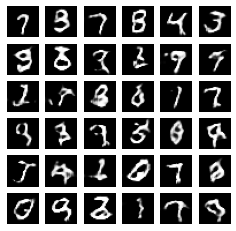

Epoch 100, Gen Loss: 0.21331138908863068, Disc Loss: 0.09624584019184113, time: 5.72549033164978


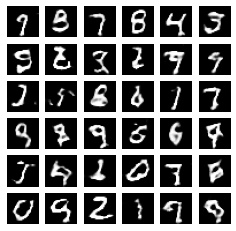

Epoch 101, Gen Loss: 0.24264401197433472, Disc Loss: 0.08606145530939102, time: 6.034016847610474


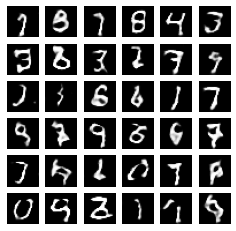

Epoch 102, Gen Loss: 0.24159905314445496, Disc Loss: 0.09261580556631088, time: 5.773939371109009


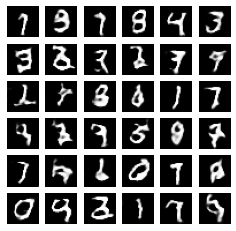

Epoch 103, Gen Loss: 0.22454534471035004, Disc Loss: 0.09402797371149063, time: 6.12390923500061


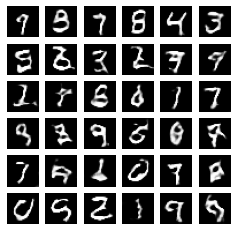

Epoch 104, Gen Loss: 0.24069397151470184, Disc Loss: 0.08668278902769089, time: 5.659804582595825


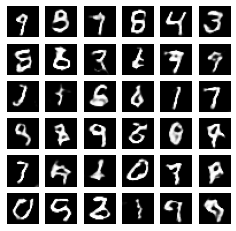

Epoch 105, Gen Loss: 0.2228090465068817, Disc Loss: 0.09433427453041077, time: 6.103444337844849


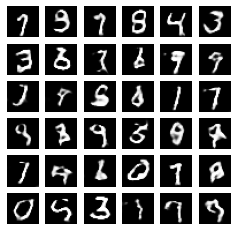

Epoch 106, Gen Loss: 0.22345136106014252, Disc Loss: 0.09350930154323578, time: 5.806311368942261


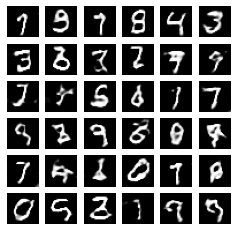

Epoch 107, Gen Loss: 0.24061249196529388, Disc Loss: 0.08908957988023758, time: 6.651593923568726


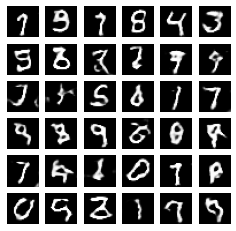

Epoch 108, Gen Loss: 0.23597654700279236, Disc Loss: 0.08643606305122375, time: 6.518074989318848


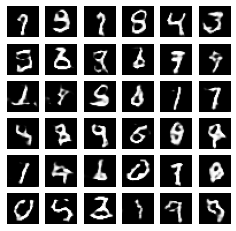

Epoch 109, Gen Loss: 0.22759336233139038, Disc Loss: 0.09812701493501663, time: 5.753835678100586


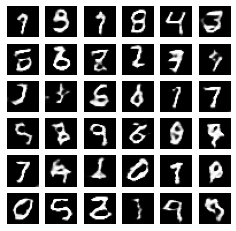

Epoch 110, Gen Loss: 0.24220965802669525, Disc Loss: 0.09038262814283371, time: 6.28130316734314


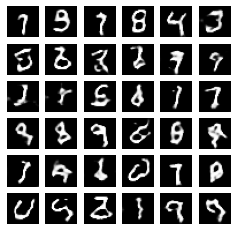

Epoch 111, Gen Loss: 0.2628985345363617, Disc Loss: 0.08150431513786316, time: 5.788721561431885


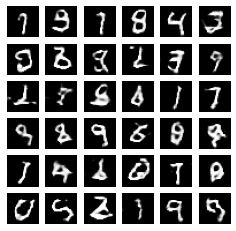

Epoch 112, Gen Loss: 0.2366722971200943, Disc Loss: 0.08912169188261032, time: 6.186452627182007


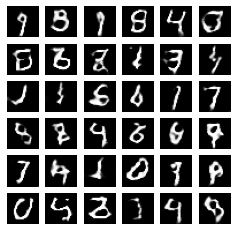

Epoch 113, Gen Loss: 0.26139479875564575, Disc Loss: 0.08634229749441147, time: 5.8119494915008545


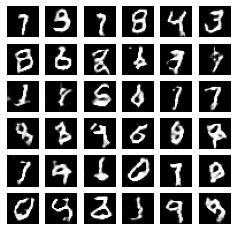

Epoch 114, Gen Loss: 0.2622217833995819, Disc Loss: 0.08629477769136429, time: 6.285980463027954


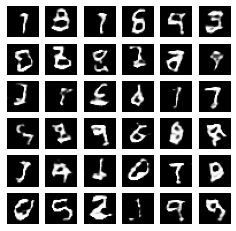

Epoch 115, Gen Loss: 0.26330578327178955, Disc Loss: 0.08162550628185272, time: 5.864653825759888


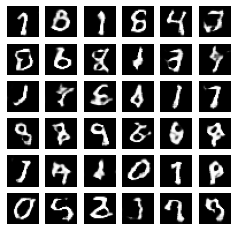

Epoch 116, Gen Loss: 0.2573947012424469, Disc Loss: 0.08534786105155945, time: 6.353983640670776


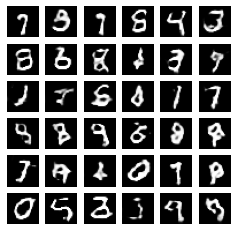

Epoch 117, Gen Loss: 0.26627618074417114, Disc Loss: 0.07585181295871735, time: 5.610387086868286


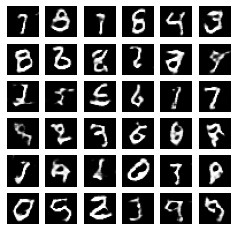

Epoch 118, Gen Loss: 0.26251018047332764, Disc Loss: 0.09542542695999146, time: 6.192030668258667


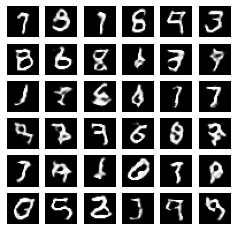

Epoch 119, Gen Loss: 0.2601358890533447, Disc Loss: 0.08062665164470673, time: 5.9226648807525635


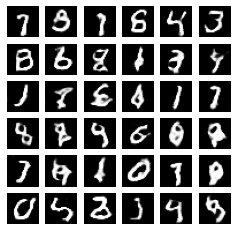

Epoch 120, Gen Loss: 0.23459181189537048, Disc Loss: 0.08943378180265427, time: 6.344003200531006


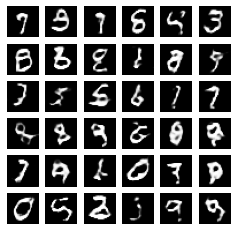

Epoch 121, Gen Loss: 0.2636149525642395, Disc Loss: 0.08564890921115875, time: 5.732006788253784


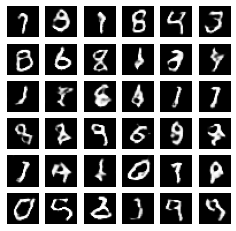

Epoch 122, Gen Loss: 0.23649398982524872, Disc Loss: 0.09082324802875519, time: 6.256422519683838


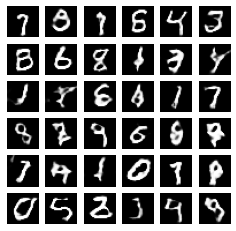

Epoch 123, Gen Loss: 0.2509915232658386, Disc Loss: 0.07969297468662262, time: 6.348810434341431


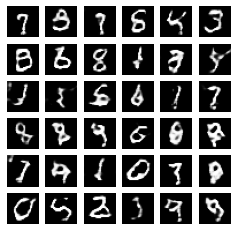

Epoch 124, Gen Loss: 0.2559627592563629, Disc Loss: 0.09293504804372787, time: 5.748240232467651


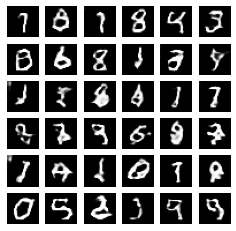

Epoch 125, Gen Loss: 0.24356529116630554, Disc Loss: 0.08345385640859604, time: 6.393973350524902


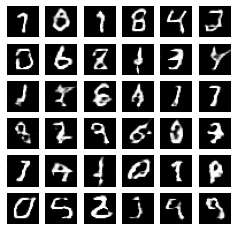

Epoch 126, Gen Loss: 0.2626589238643646, Disc Loss: 0.08330661058425903, time: 5.663329601287842


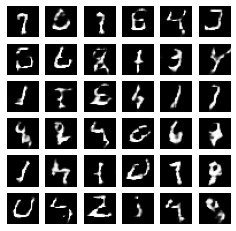

Epoch 127, Gen Loss: 0.3267255425453186, Disc Loss: 0.07391492277383804, time: 6.465642690658569


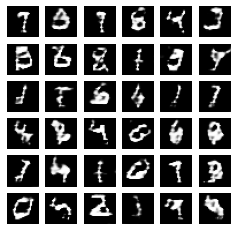

Epoch 128, Gen Loss: 0.36021363735198975, Disc Loss: 0.061278242617845535, time: 5.782038688659668


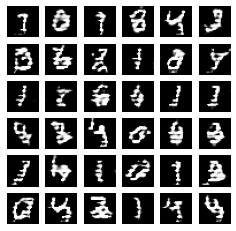

Epoch 129, Gen Loss: 0.31359681487083435, Disc Loss: 0.061952605843544006, time: 6.374307870864868


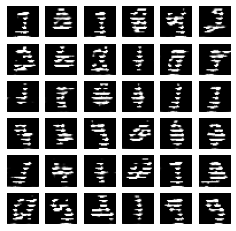

Epoch 130, Gen Loss: 0.4282976984977722, Disc Loss: 0.0933794379234314, time: 5.910873651504517


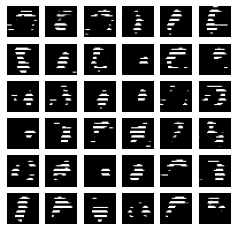

Epoch 131, Gen Loss: 0.43435198068618774, Disc Loss: 0.08985134959220886, time: 6.262510299682617


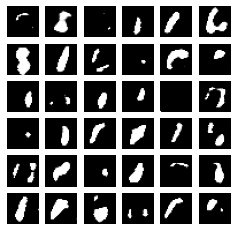

Epoch 132, Gen Loss: 0.6318576335906982, Disc Loss: 0.06721673905849457, time: 5.641465902328491


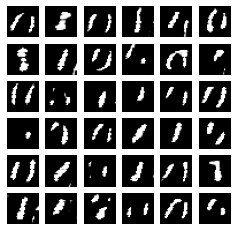

Epoch 133, Gen Loss: 0.49141955375671387, Disc Loss: 0.04558398947119713, time: 5.70683741569519


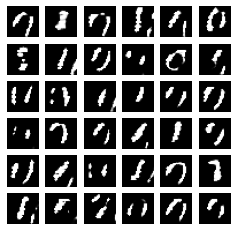

Epoch 134, Gen Loss: 0.4972478449344635, Disc Loss: 0.028885195031762123, time: 6.4760966300964355


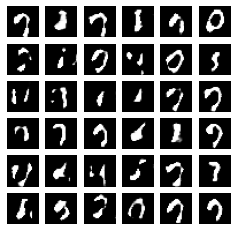

Epoch 135, Gen Loss: 0.4691777229309082, Disc Loss: 0.03186297416687012, time: 6.1883275508880615


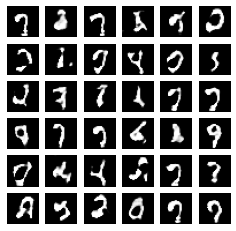

Epoch 136, Gen Loss: 0.40852028131484985, Disc Loss: 0.04181317612528801, time: 5.881938457489014


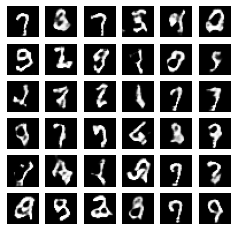

Epoch 137, Gen Loss: 0.33990994095802307, Disc Loss: 0.061251211911439896, time: 6.218261241912842


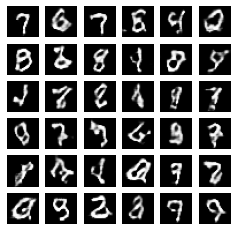

Epoch 138, Gen Loss: 0.258033812046051, Disc Loss: 0.08912024646997452, time: 6.230480670928955


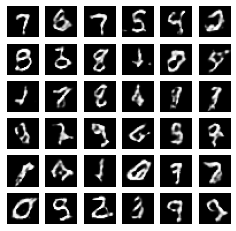

Epoch 139, Gen Loss: 0.2354358434677124, Disc Loss: 0.09238220751285553, time: 6.558234214782715


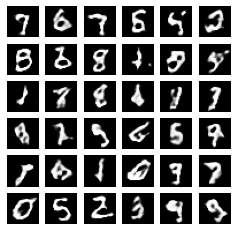

Epoch 140, Gen Loss: 0.2706006169319153, Disc Loss: 0.08548838645219803, time: 5.814932346343994


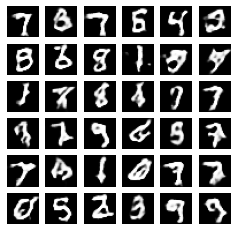

Epoch 141, Gen Loss: 0.257763534784317, Disc Loss: 0.10875364392995834, time: 6.2178428173065186


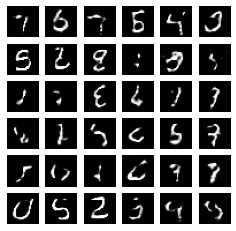

Epoch 142, Gen Loss: 0.29027432203292847, Disc Loss: 0.09942401200532913, time: 5.719209671020508


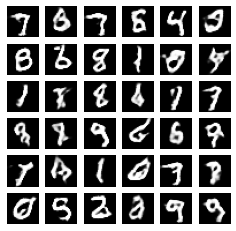

Epoch 143, Gen Loss: 0.3018566966056824, Disc Loss: 0.07361746579408646, time: 5.817131996154785


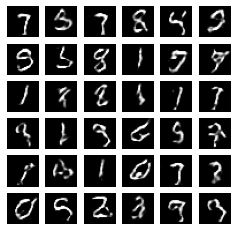

Epoch 144, Gen Loss: 0.24044717848300934, Disc Loss: 0.10394667834043503, time: 6.120729923248291


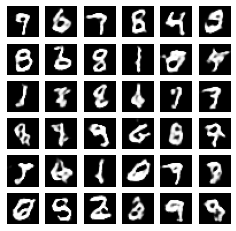

Epoch 145, Gen Loss: 0.25183215737342834, Disc Loss: 0.0970975011587143, time: 6.300945281982422


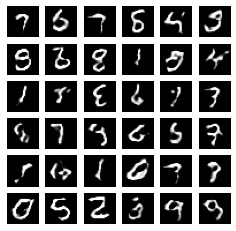

Epoch 146, Gen Loss: 0.2477569282054901, Disc Loss: 0.09682992100715637, time: 6.458394289016724


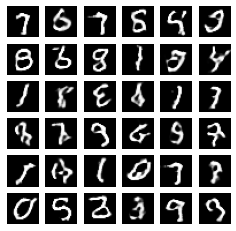

Epoch 147, Gen Loss: 0.2564881443977356, Disc Loss: 0.07578360289335251, time: 6.103607416152954


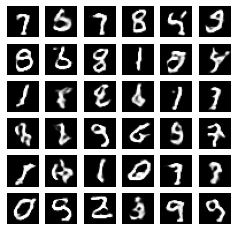

Epoch 148, Gen Loss: 0.23452478647232056, Disc Loss: 0.09484269469976425, time: 5.795012712478638


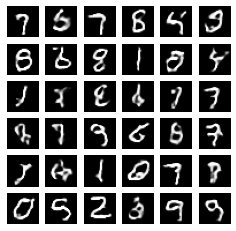

Epoch 149, Gen Loss: 0.2252245545387268, Disc Loss: 0.09976732730865479, time: 6.408234596252441


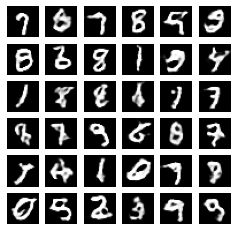

Epoch 150, Gen Loss: 0.21560193598270416, Disc Loss: 0.09574966132640839, time: 5.639949083328247


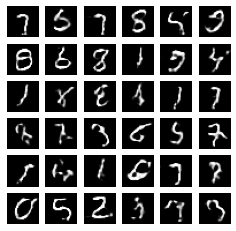

Epoch 151, Gen Loss: 0.23039831221103668, Disc Loss: 0.09858991205692291, time: 6.312924385070801


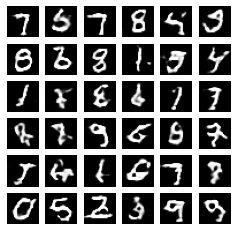

Epoch 152, Gen Loss: 0.24996839463710785, Disc Loss: 0.09109363704919815, time: 5.881791830062866


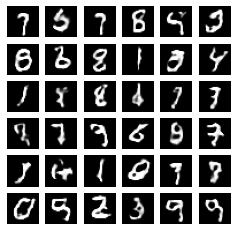

Epoch 153, Gen Loss: 0.22826173901557922, Disc Loss: 0.09560272842645645, time: 6.280391216278076


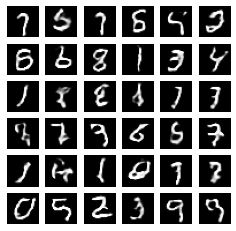

Epoch 154, Gen Loss: 0.2342366874217987, Disc Loss: 0.08574900776147842, time: 5.922412395477295


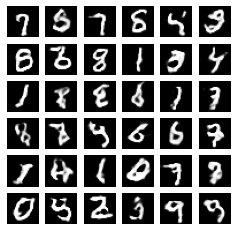

Epoch 155, Gen Loss: 0.22205863893032074, Disc Loss: 0.09618993103504181, time: 6.261833429336548


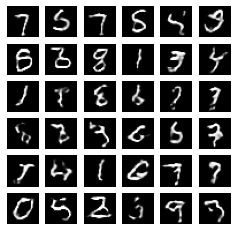

Epoch 156, Gen Loss: 0.22660326957702637, Disc Loss: 0.09628427028656006, time: 5.743481159210205


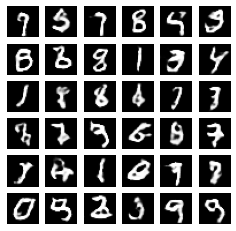

Epoch 157, Gen Loss: 0.22809402644634247, Disc Loss: 0.09285057336091995, time: 6.321310997009277


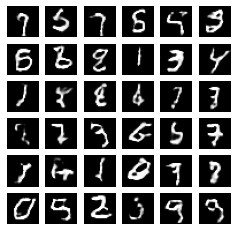

Epoch 158, Gen Loss: 0.23037472367286682, Disc Loss: 0.09105667471885681, time: 5.82341742515564


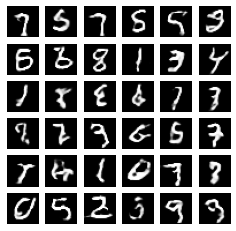

Epoch 159, Gen Loss: 0.2357795238494873, Disc Loss: 0.08711300045251846, time: 6.481988191604614


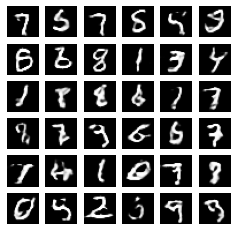

Epoch 160, Gen Loss: 0.21036699414253235, Disc Loss: 0.10069204866886139, time: 6.3604512214660645


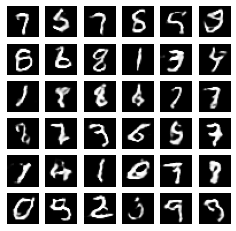

Epoch 161, Gen Loss: 0.2193044275045395, Disc Loss: 0.08998295664787292, time: 5.771409511566162


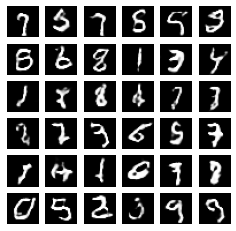

Epoch 162, Gen Loss: 0.20996813476085663, Disc Loss: 0.09902799129486084, time: 5.722903728485107


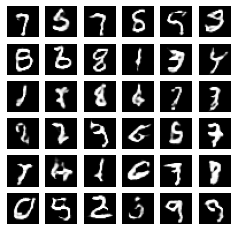

Epoch 163, Gen Loss: 0.22918836772441864, Disc Loss: 0.08658063411712646, time: 6.4153077602386475


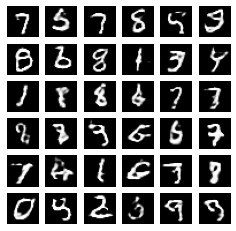

Epoch 164, Gen Loss: 0.21025092899799347, Disc Loss: 0.10126256197690964, time: 6.5264387130737305


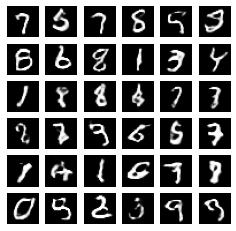

Epoch 165, Gen Loss: 0.22281193733215332, Disc Loss: 0.08773338049650192, time: 5.785531759262085


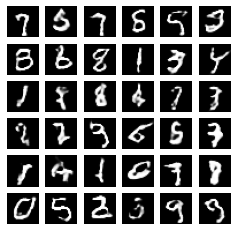

Epoch 166, Gen Loss: 0.2223174124956131, Disc Loss: 0.09570710361003876, time: 6.1080238819122314


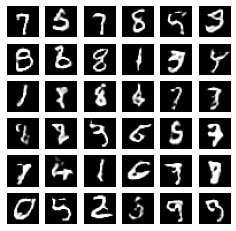

Epoch 167, Gen Loss: 0.22901880741119385, Disc Loss: 0.09037917107343674, time: 5.872515439987183


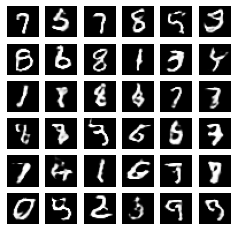

Epoch 168, Gen Loss: 0.21389442682266235, Disc Loss: 0.0959756076335907, time: 6.126961708068848


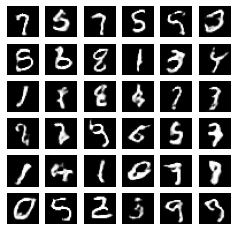

Epoch 169, Gen Loss: 0.22193558514118195, Disc Loss: 0.09676042944192886, time: 5.688254117965698


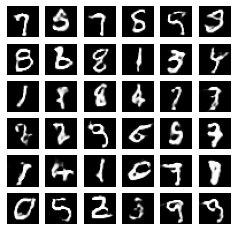

Epoch 170, Gen Loss: 0.23333124816417694, Disc Loss: 0.08929634094238281, time: 6.251943826675415


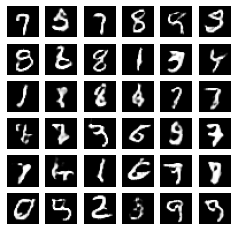

Epoch 171, Gen Loss: 0.21263214945793152, Disc Loss: 0.10612316429615021, time: 5.871903419494629


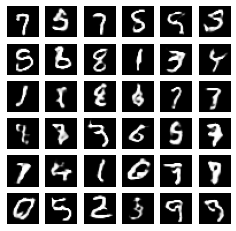

Epoch 172, Gen Loss: 0.22613990306854248, Disc Loss: 0.08917771279811859, time: 6.063767671585083


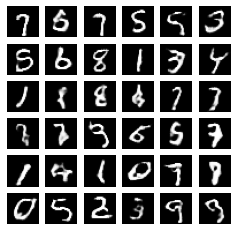

Epoch 173, Gen Loss: 0.22113245725631714, Disc Loss: 0.10261168330907822, time: 5.718230724334717


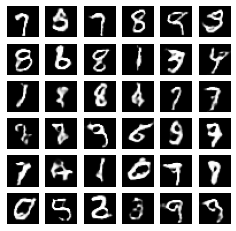

Epoch 174, Gen Loss: 0.22206391394138336, Disc Loss: 0.09769216924905777, time: 6.105364561080933


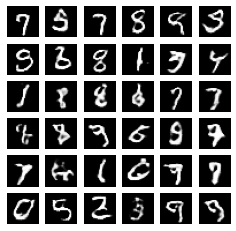

Epoch 175, Gen Loss: 0.21853546798229218, Disc Loss: 0.10255230963230133, time: 5.733850479125977


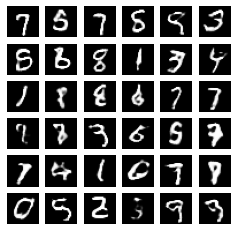

Epoch 176, Gen Loss: 0.21876920759677887, Disc Loss: 0.09222479909658432, time: 6.087782382965088


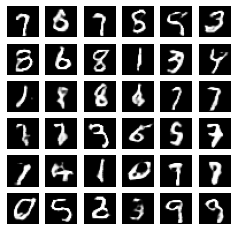

Epoch 177, Gen Loss: 0.21588779985904694, Disc Loss: 0.1022200733423233, time: 5.921961545944214


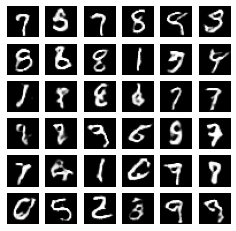

Epoch 178, Gen Loss: 0.23026016354560852, Disc Loss: 0.09616459906101227, time: 6.060027599334717


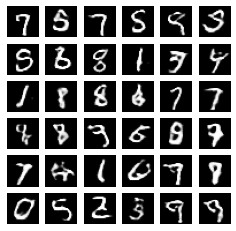

Epoch 179, Gen Loss: 0.20949921011924744, Disc Loss: 0.10348288714885712, time: 5.757857322692871


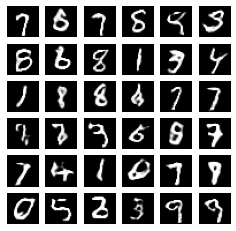

Epoch 180, Gen Loss: 0.21745972335338593, Disc Loss: 0.09617149084806442, time: 6.314204216003418


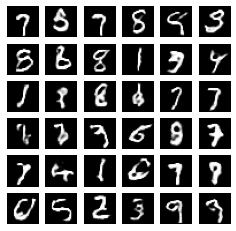

Epoch 181, Gen Loss: 0.2114218920469284, Disc Loss: 0.10463056713342667, time: 5.776779651641846


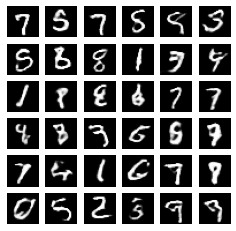

Epoch 182, Gen Loss: 0.21660634875297546, Disc Loss: 0.09977710247039795, time: 6.134569883346558


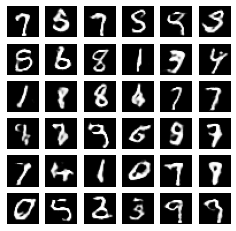

Epoch 183, Gen Loss: 0.21238872408866882, Disc Loss: 0.10176074504852295, time: 5.630557537078857


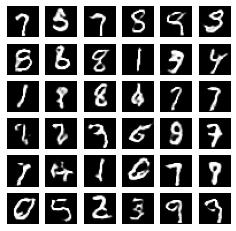

Epoch 184, Gen Loss: 0.21890974044799805, Disc Loss: 0.10188630223274231, time: 6.032442808151245


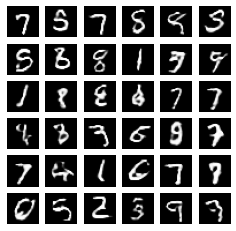

Epoch 185, Gen Loss: 0.21116097271442413, Disc Loss: 0.10344288498163223, time: 5.785160541534424


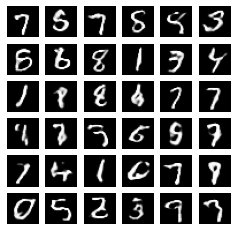

Epoch 186, Gen Loss: 0.21066482365131378, Disc Loss: 0.10204390436410904, time: 6.116648197174072


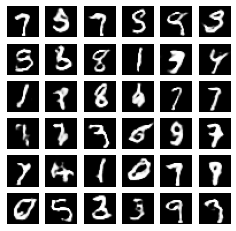

Epoch 187, Gen Loss: 0.21857622265815735, Disc Loss: 0.10361681133508682, time: 6.025973558425903


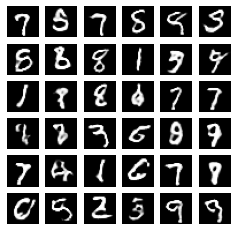

Epoch 188, Gen Loss: 0.2187836468219757, Disc Loss: 0.09804696589708328, time: 6.251596689224243


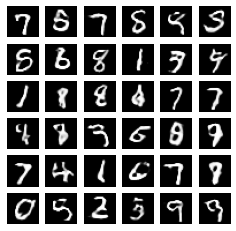

Epoch 189, Gen Loss: 0.21149207651615143, Disc Loss: 0.10203909128904343, time: 6.37823486328125


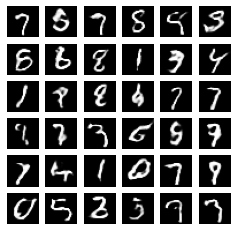

Epoch 190, Gen Loss: 0.21469569206237793, Disc Loss: 0.10469922423362732, time: 5.625694513320923


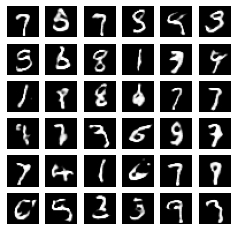

Epoch 191, Gen Loss: 0.21432186663150787, Disc Loss: 0.10408710688352585, time: 6.236475229263306


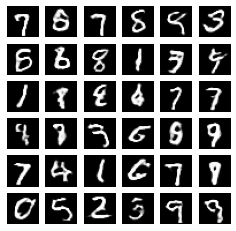

Epoch 192, Gen Loss: 0.21797679364681244, Disc Loss: 0.10435409098863602, time: 5.822917461395264


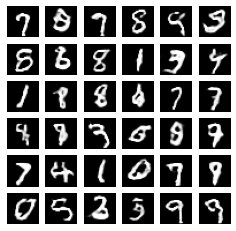

Epoch 193, Gen Loss: 0.21252849698066711, Disc Loss: 0.10678470879793167, time: 6.328046798706055


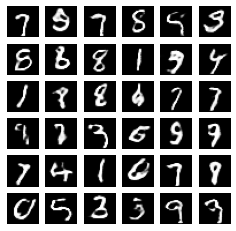

Epoch 194, Gen Loss: 0.219399094581604, Disc Loss: 0.10020740330219269, time: 5.724570989608765


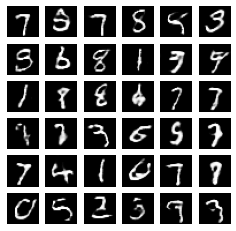

Epoch 195, Gen Loss: 0.21364343166351318, Disc Loss: 0.10333345830440521, time: 6.398492336273193


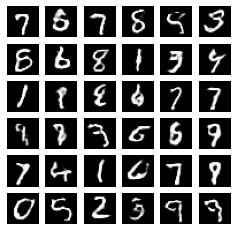

Epoch 196, Gen Loss: 0.22146448493003845, Disc Loss: 0.11085112392902374, time: 6.302684783935547


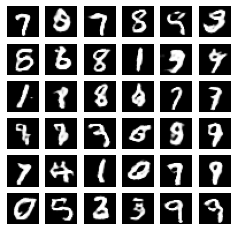

Epoch 197, Gen Loss: 0.21017661690711975, Disc Loss: 0.1029321551322937, time: 6.329065322875977


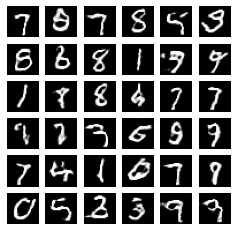

Epoch 198, Gen Loss: 0.2492389678955078, Disc Loss: 0.10384231060743332, time: 5.655202150344849


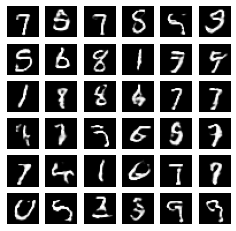

Epoch 199, Gen Loss: 0.23247770965099335, Disc Loss: 0.1129467785358429, time: 6.1353888511657715


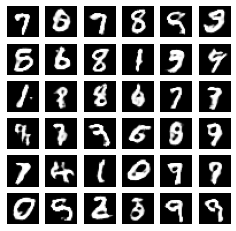

Epoch 200, Gen Loss: 0.24128733575344086, Disc Loss: 0.1119418740272522, time: 5.7763237953186035


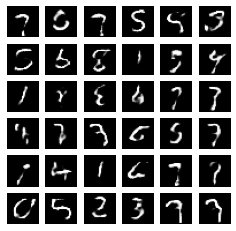

Epoch 201, Gen Loss: 0.24315349757671356, Disc Loss: 0.12034865468740463, time: 6.142713308334351


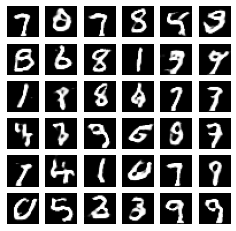

Epoch 202, Gen Loss: 0.2549516260623932, Disc Loss: 0.08487310260534286, time: 5.680088520050049


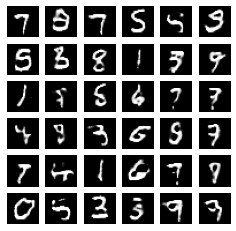

Epoch 203, Gen Loss: 0.20892418920993805, Disc Loss: 0.10339370369911194, time: 6.59107232093811


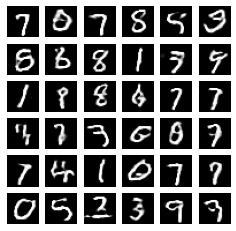

Epoch 204, Gen Loss: 0.22170117497444153, Disc Loss: 0.09214071929454803, time: 6.010631322860718


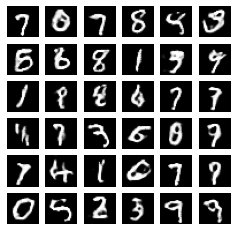

Epoch 205, Gen Loss: 0.1952994167804718, Disc Loss: 0.10428684204816818, time: 6.364895582199097


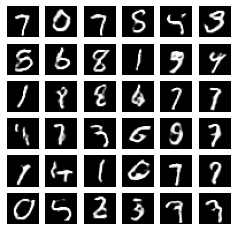

Epoch 206, Gen Loss: 0.21918579936027527, Disc Loss: 0.0936191976070404, time: 5.973462104797363


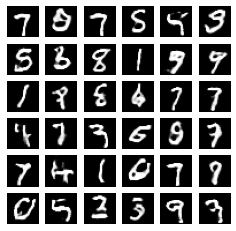

Epoch 207, Gen Loss: 0.20279954373836517, Disc Loss: 0.11265844851732254, time: 6.271080493927002


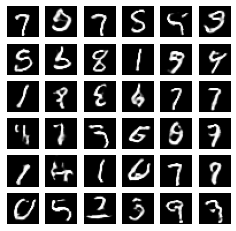

Epoch 208, Gen Loss: 0.2055625319480896, Disc Loss: 0.10607621818780899, time: 5.755650997161865


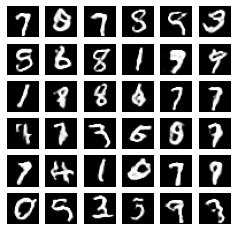

Epoch 209, Gen Loss: 0.19740065932273865, Disc Loss: 0.11076713353395462, time: 6.295803785324097


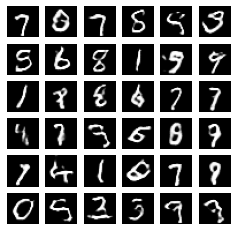

Epoch 210, Gen Loss: 0.20023846626281738, Disc Loss: 0.10859599709510803, time: 5.651836633682251


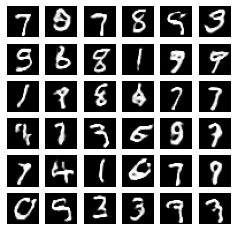

Epoch 211, Gen Loss: 0.20124609768390656, Disc Loss: 0.11027727276086807, time: 6.337836027145386


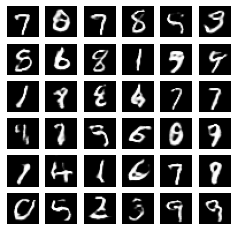

Epoch 212, Gen Loss: 0.18813484907150269, Disc Loss: 0.10575592517852783, time: 5.762545824050903


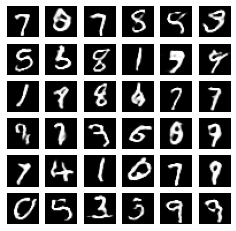

Epoch 213, Gen Loss: 0.19071707129478455, Disc Loss: 0.10973788797855377, time: 6.2851221561431885


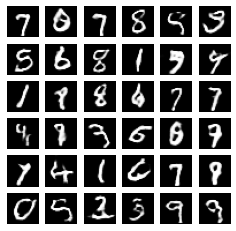

Epoch 214, Gen Loss: 0.18714825809001923, Disc Loss: 0.10864104330539703, time: 5.703918218612671


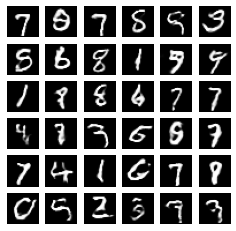

Epoch 215, Gen Loss: 0.1850026249885559, Disc Loss: 0.1114593893289566, time: 6.168268442153931


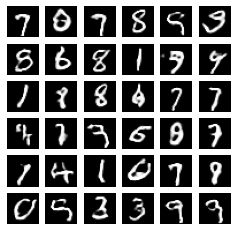

Epoch 216, Gen Loss: 0.18860284984111786, Disc Loss: 0.11189007759094238, time: 5.860833168029785


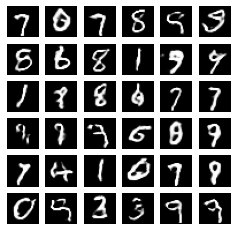

Epoch 217, Gen Loss: 0.18460829555988312, Disc Loss: 0.11238715052604675, time: 6.43816065788269


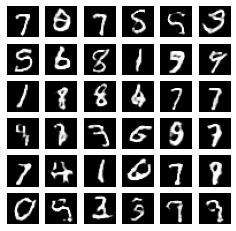

Epoch 218, Gen Loss: 0.18699654936790466, Disc Loss: 0.11355949938297272, time: 6.23935341835022


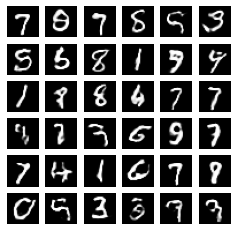

Epoch 219, Gen Loss: 0.19248346984386444, Disc Loss: 0.10634341835975647, time: 5.640600919723511


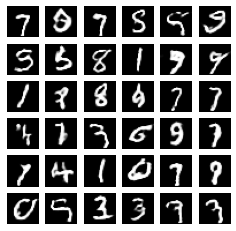

Epoch 220, Gen Loss: 0.19946259260177612, Disc Loss: 0.11051356792449951, time: 6.195032358169556


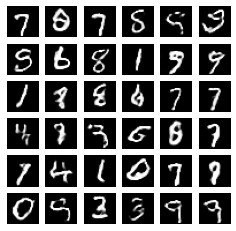

Epoch 221, Gen Loss: 0.19872073829174042, Disc Loss: 0.11073515564203262, time: 5.748179197311401


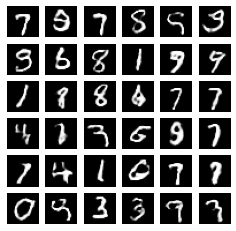

Epoch 222, Gen Loss: 0.1961204707622528, Disc Loss: 0.10258406400680542, time: 6.021408796310425


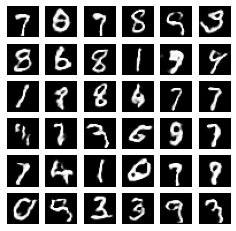

Epoch 223, Gen Loss: 0.19107982516288757, Disc Loss: 0.11832369118928909, time: 5.783875465393066


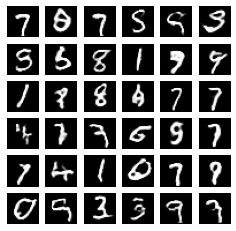

Epoch 224, Gen Loss: 0.2033453732728958, Disc Loss: 0.10156647861003876, time: 6.250725030899048


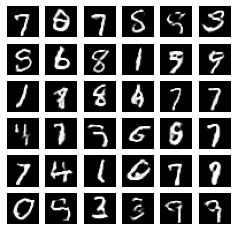

Epoch 225, Gen Loss: 0.1833408921957016, Disc Loss: 0.11451411992311478, time: 5.800730466842651


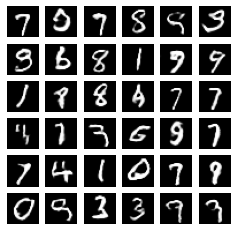

Epoch 226, Gen Loss: 0.19611424207687378, Disc Loss: 0.10516829788684845, time: 6.499578475952148


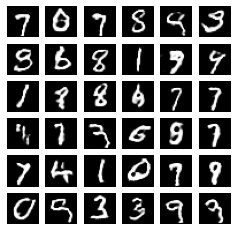

Epoch 227, Gen Loss: 0.18161439895629883, Disc Loss: 0.11679048836231232, time: 6.084120512008667


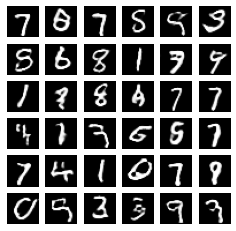

Epoch 228, Gen Loss: 0.1968403458595276, Disc Loss: 0.10362391918897629, time: 6.2402613162994385


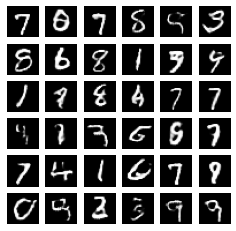

Epoch 229, Gen Loss: 0.17291061580181122, Disc Loss: 0.12142527103424072, time: 5.984286308288574


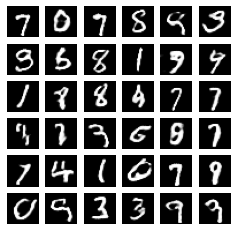

Epoch 230, Gen Loss: 0.20001432299613953, Disc Loss: 0.1076422929763794, time: 5.7143800258636475


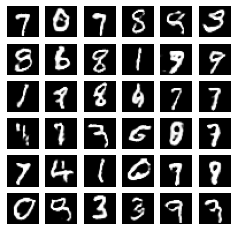

Epoch 231, Gen Loss: 0.18845607340335846, Disc Loss: 0.11367293447256088, time: 6.34921932220459


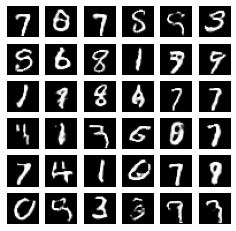

Epoch 232, Gen Loss: 0.18891821801662445, Disc Loss: 0.11150307953357697, time: 5.861685514450073


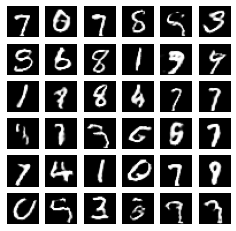

Epoch 233, Gen Loss: 0.1864187866449356, Disc Loss: 0.11268234997987747, time: 6.212762355804443


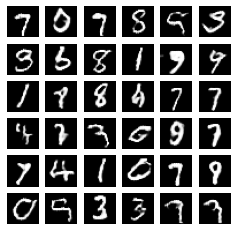

Epoch 234, Gen Loss: 0.1953473836183548, Disc Loss: 0.11350385844707489, time: 5.678659677505493


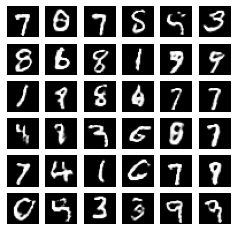

Epoch 235, Gen Loss: 0.19178444147109985, Disc Loss: 0.11122475564479828, time: 6.198824644088745


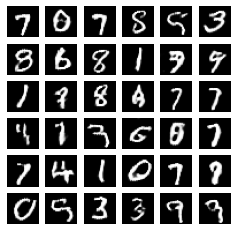

Epoch 236, Gen Loss: 0.18607454001903534, Disc Loss: 0.10898630321025848, time: 5.8180928230285645


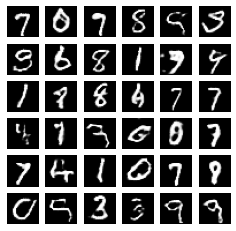

Epoch 237, Gen Loss: 0.19771650433540344, Disc Loss: 0.11411760747432709, time: 6.866950511932373


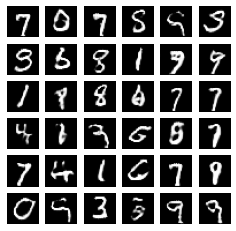

Epoch 238, Gen Loss: 0.1897372305393219, Disc Loss: 0.1174902394413948, time: 6.315508127212524


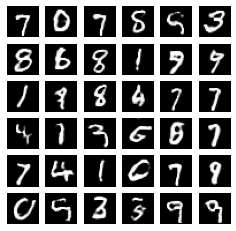

Epoch 239, Gen Loss: 0.1956491768360138, Disc Loss: 0.10361533612012863, time: 5.708536148071289


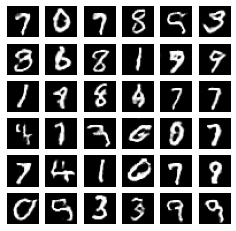

Epoch 240, Gen Loss: 0.17763906717300415, Disc Loss: 0.12323915213346481, time: 6.190667152404785


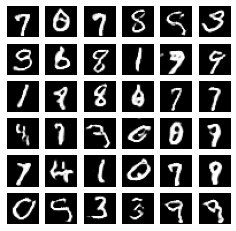

Epoch 241, Gen Loss: 0.19457490742206573, Disc Loss: 0.1083722710609436, time: 5.639402151107788


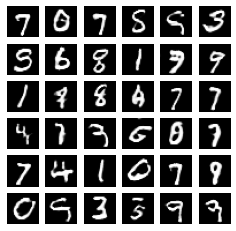

Epoch 242, Gen Loss: 0.18965475261211395, Disc Loss: 0.11196818947792053, time: 6.437812089920044


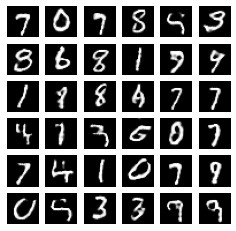

Epoch 243, Gen Loss: 0.17770685255527496, Disc Loss: 0.11606795340776443, time: 6.7584452629089355


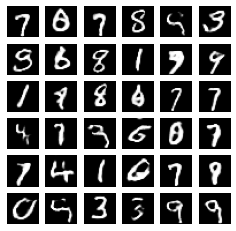

Epoch 244, Gen Loss: 0.1924130618572235, Disc Loss: 0.1112685352563858, time: 6.5301432609558105


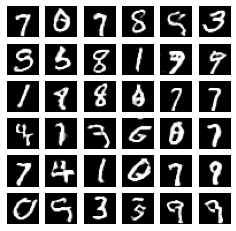

Epoch 245, Gen Loss: 0.19243788719177246, Disc Loss: 0.11318115144968033, time: 5.725322484970093


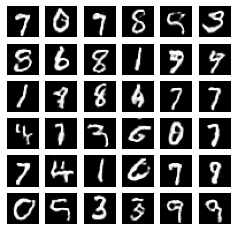

Epoch 246, Gen Loss: 0.18118755519390106, Disc Loss: 0.1211143359541893, time: 6.146384239196777


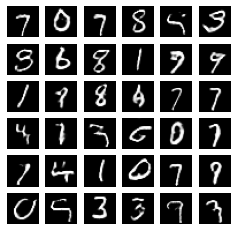

Epoch 247, Gen Loss: 0.19013608992099762, Disc Loss: 0.11441627144813538, time: 6.000167608261108


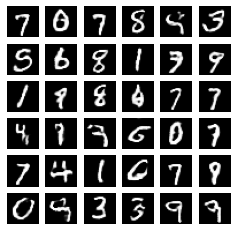

Epoch 248, Gen Loss: 0.19892682135105133, Disc Loss: 0.11867416650056839, time: 5.73129415512085


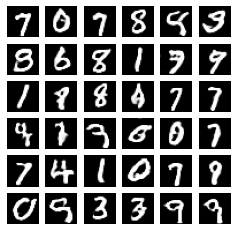

Epoch 249, Gen Loss: 0.22384753823280334, Disc Loss: 0.11487891525030136, time: 6.071259260177612


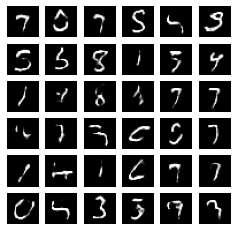

Epoch 250, Gen Loss: 0.24266506731510162, Disc Loss: 0.12155763059854507, time: 5.685023069381714


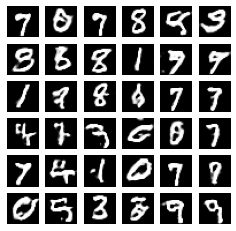

Epoch 251, Gen Loss: 0.21852222084999084, Disc Loss: 0.10209119319915771, time: 6.161171913146973


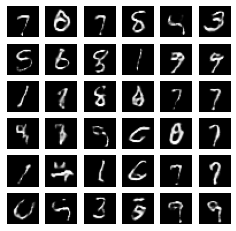

Epoch 252, Gen Loss: 0.20788700878620148, Disc Loss: 0.11637130379676819, time: 5.7235846519470215


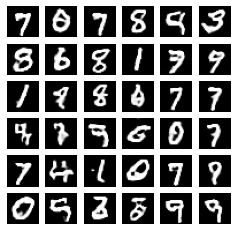

Epoch 253, Gen Loss: 0.2194543331861496, Disc Loss: 0.10259978473186493, time: 6.442877531051636


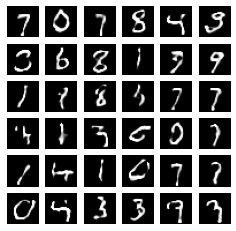

Epoch 254, Gen Loss: 0.20758940279483795, Disc Loss: 0.11295168846845627, time: 5.726306200027466


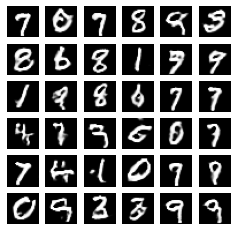

Epoch 255, Gen Loss: 0.21024329960346222, Disc Loss: 0.1013663187623024, time: 6.155186891555786


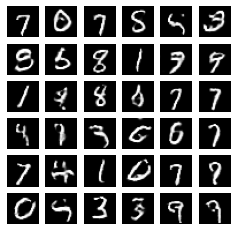

Epoch 256, Gen Loss: 0.17851610481739044, Disc Loss: 0.11534644663333893, time: 6.061583042144775


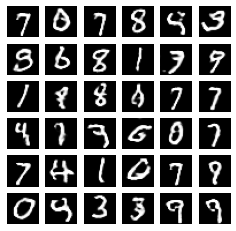

Epoch 257, Gen Loss: 0.2009756863117218, Disc Loss: 0.10316617786884308, time: 5.628162384033203


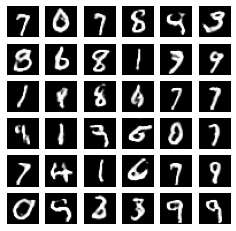

Epoch 258, Gen Loss: 0.18939433991909027, Disc Loss: 0.11637263745069504, time: 6.2488343715667725


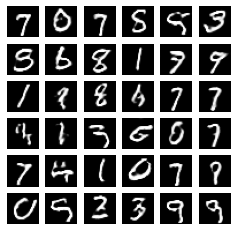

Epoch 259, Gen Loss: 0.1983634978532791, Disc Loss: 0.11258579045534134, time: 5.743320465087891


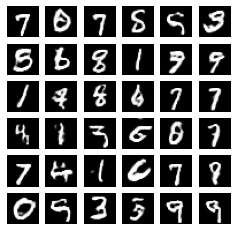

Epoch 260, Gen Loss: 0.1770748794078827, Disc Loss: 0.11277845501899719, time: 6.014478921890259


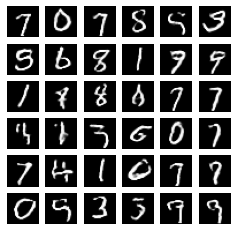

Epoch 261, Gen Loss: 0.1785401999950409, Disc Loss: 0.11025785654783249, time: 5.733830451965332


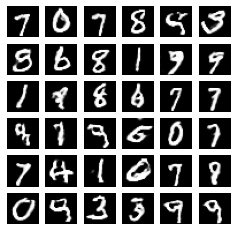

Epoch 262, Gen Loss: 0.18308234214782715, Disc Loss: 0.11488896608352661, time: 6.248408794403076


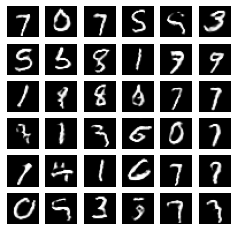

Epoch 263, Gen Loss: 0.1844678670167923, Disc Loss: 0.10862896591424942, time: 5.790462493896484


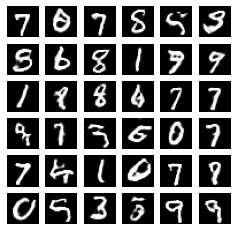

Epoch 264, Gen Loss: 0.18972434103488922, Disc Loss: 0.1089203953742981, time: 6.2088782787323


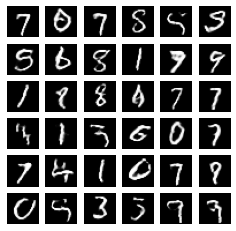

Epoch 265, Gen Loss: 0.17489327490329742, Disc Loss: 0.1171317771077156, time: 6.265730619430542


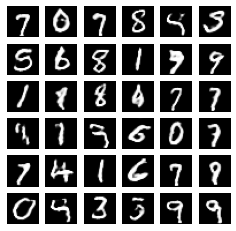

Epoch 266, Gen Loss: 0.18280184268951416, Disc Loss: 0.11204364150762558, time: 5.780363082885742


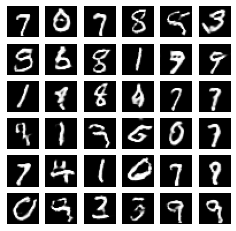

Epoch 267, Gen Loss: 0.17892581224441528, Disc Loss: 0.11689886450767517, time: 6.3348753452301025


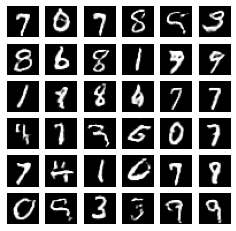

Epoch 268, Gen Loss: 0.17207670211791992, Disc Loss: 0.11866520345211029, time: 5.839282035827637


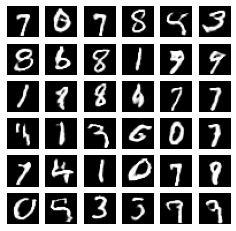

Epoch 269, Gen Loss: 0.17758680880069733, Disc Loss: 0.11414820700883865, time: 6.411773204803467


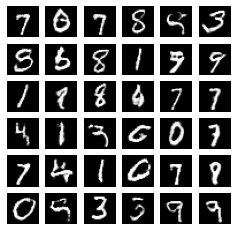

Epoch 270, Gen Loss: 0.17026843130588531, Disc Loss: 0.12219907343387604, time: 5.653360366821289


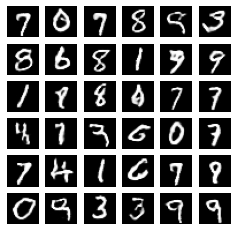

Epoch 271, Gen Loss: 0.17170701920986176, Disc Loss: 0.11677643656730652, time: 6.262182950973511


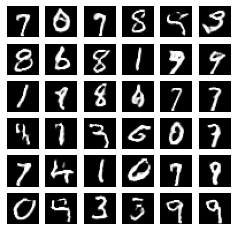

Epoch 272, Gen Loss: 0.17670661211013794, Disc Loss: 0.11273714900016785, time: 5.688960313796997


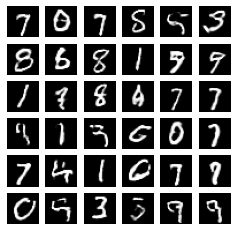

Epoch 273, Gen Loss: 0.17174483835697174, Disc Loss: 0.12006694078445435, time: 6.05668044090271


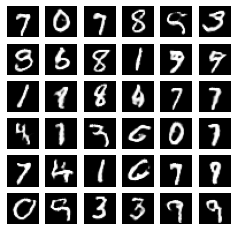

Epoch 274, Gen Loss: 0.17284439504146576, Disc Loss: 0.11385935544967651, time: 6.0653300285339355


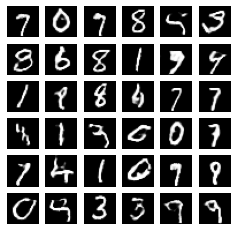

Epoch 275, Gen Loss: 0.16989992558956146, Disc Loss: 0.1199454590678215, time: 5.771109342575073


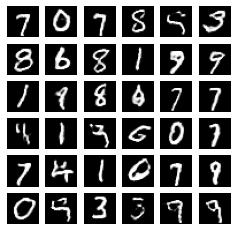

Epoch 276, Gen Loss: 0.1751367151737213, Disc Loss: 0.11530838161706924, time: 6.101781129837036


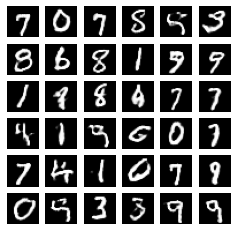

Epoch 277, Gen Loss: 0.16930605471134186, Disc Loss: 0.11887989193201065, time: 5.700903654098511


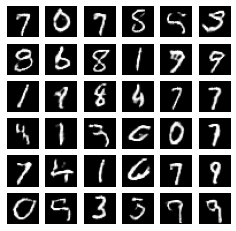

Epoch 278, Gen Loss: 0.16918475925922394, Disc Loss: 0.12240473926067352, time: 6.206178188323975


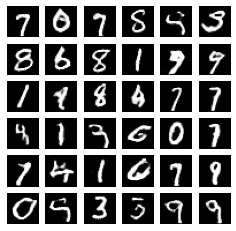

Epoch 279, Gen Loss: 0.17735892534255981, Disc Loss: 0.11619740724563599, time: 5.883522033691406


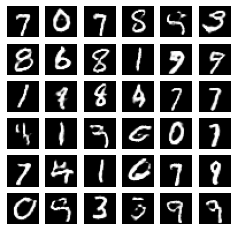

Epoch 280, Gen Loss: 0.17851366102695465, Disc Loss: 0.11762087792158127, time: 6.194254398345947


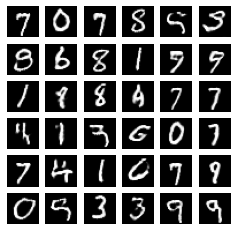

Epoch 281, Gen Loss: 0.16804850101470947, Disc Loss: 0.1212506964802742, time: 5.692976713180542


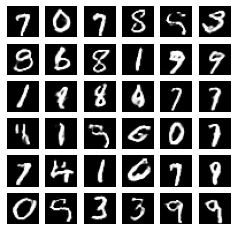

Epoch 282, Gen Loss: 0.17135851085186005, Disc Loss: 0.11492791771888733, time: 6.445806980133057


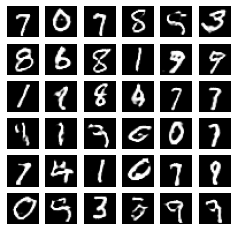

Epoch 283, Gen Loss: 0.18214058876037598, Disc Loss: 0.1156214028596878, time: 6.191110610961914


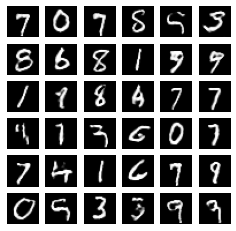

Epoch 284, Gen Loss: 0.1709216684103012, Disc Loss: 0.12022682279348373, time: 5.651182413101196


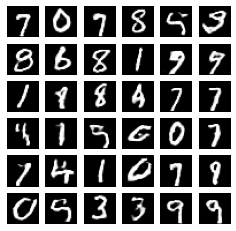

Epoch 285, Gen Loss: 0.17719724774360657, Disc Loss: 0.11534836888313293, time: 6.3593950271606445


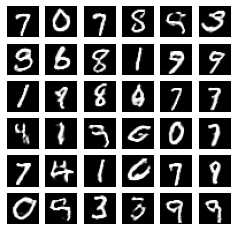

Epoch 286, Gen Loss: 0.1933893859386444, Disc Loss: 0.11641605943441391, time: 5.739919900894165


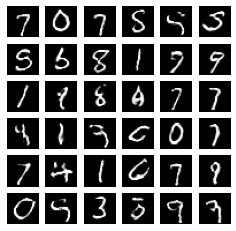

Epoch 287, Gen Loss: 0.18689094483852386, Disc Loss: 0.12019830197095871, time: 7.236376047134399


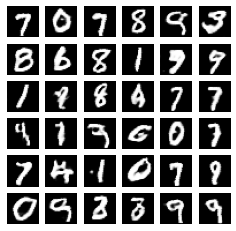

Epoch 288, Gen Loss: 0.18009985983371735, Disc Loss: 0.1235753744840622, time: 5.703251600265503


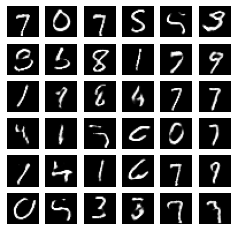

Epoch 289, Gen Loss: 0.21924777328968048, Disc Loss: 0.10819379985332489, time: 6.190970420837402


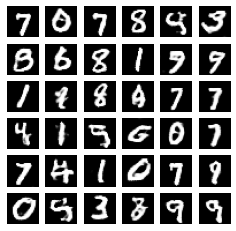

Epoch 290, Gen Loss: 0.18583713471889496, Disc Loss: 0.12025604397058487, time: 5.879554510116577


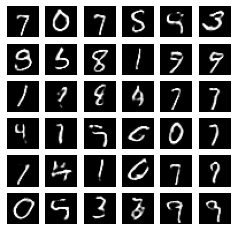

Epoch 291, Gen Loss: 0.20437772572040558, Disc Loss: 0.10522241145372391, time: 6.2454047203063965


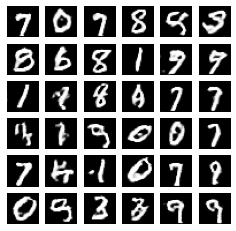

Epoch 292, Gen Loss: 0.17734986543655396, Disc Loss: 0.12274176627397537, time: 6.187572956085205


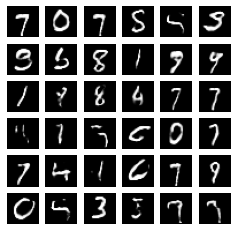

Epoch 293, Gen Loss: 0.1886773258447647, Disc Loss: 0.10728100687265396, time: 5.6073267459869385


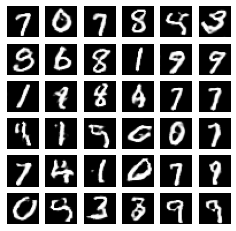

Epoch 294, Gen Loss: 0.20014280080795288, Disc Loss: 0.10931700468063354, time: 6.292511224746704


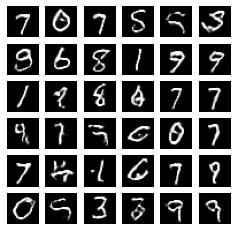

Epoch 295, Gen Loss: 0.178013876080513, Disc Loss: 0.11274396628141403, time: 6.007165431976318


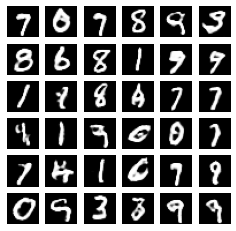

Epoch 296, Gen Loss: 0.18949605524539948, Disc Loss: 0.11268021166324615, time: 6.3580482006073


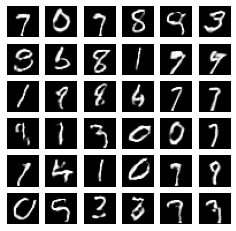

Epoch 297, Gen Loss: 0.19642244279384613, Disc Loss: 0.11702432483434677, time: 5.8482184410095215


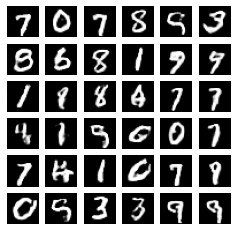

Epoch 298, Gen Loss: 0.17624077200889587, Disc Loss: 0.1180671826004982, time: 6.320972919464111


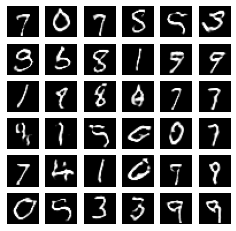

Epoch 299, Gen Loss: 0.192954882979393, Disc Loss: 0.11140938103199005, time: 5.8954267501831055


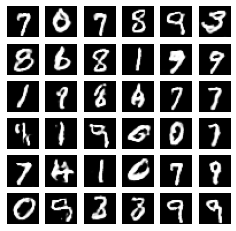

Epoch 300, Gen Loss: 0.18202298879623413, Disc Loss: 0.1177983433008194, time: 6.351046323776245


In [ ]:
# `run` replicates the provided computation and runs it
# with the distributed input.
@tf.function
def distributed_train_step(dataset_inputs):
  per_replica_losses = strategy.run(train_step, args=(dataset_inputs,0.0))
  return strategy.reduce(tf.distribute.ReduceOp.MEAN, per_replica_losses,
                         axis=None)

time_history = np.zeros((EPOCHS,))
for epoch in range(EPOCHS):
  # TRAIN LOOP
  total_gen_loss = 0.0
  total_disc_loss = 0.0
  
  num_batches = 0
  start = time.time()
  for x in train_dist_dataset:
    (gen_loss,disc_loss) = distributed_train_step(x)
    total_gen_loss += gen_loss
    total_disc_loss += disc_loss
    
    num_batches += 1
  train_gen_loss = total_gen_loss / num_batches
  train_disc_loss = total_disc_loss / num_batches
  

  # display.clear_output(wait=True)
  generate_and_save_images(generator,
                             epoch + 1,
                             seed)



  template = ("Epoch {}, Gen Loss: {}, Disc Loss: {}, time: {}")
  time_taken = time.time()-start
  print(template.format(epoch + 1, train_gen_loss, train_disc_loss, time_taken))
  time_history[epoch] = time_taken

average time taken 6.200810860792796 seconds
time for first epoch 30.161556720733643 seconds


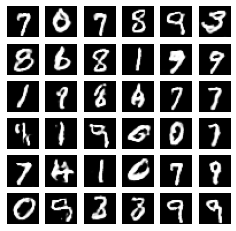

class values from decision model for the seed after training are tf.Tensor(
[[0.43246967]
 [0.09611365]
 [0.47596395]
 [0.21310675]
 [0.66325617]
 [0.5907454 ]
 [0.22782698]
 [0.6636809 ]
 [0.5135826 ]
 [0.3791588 ]
 [0.21253115]
 [0.6191896 ]
 [0.55409765]
 [0.08178952]
 [0.1868608 ]
 [0.3297149 ]
 [0.5590938 ]
 [0.44117022]
 [0.13830313]
 [0.34023744]
 [0.13005954]
 [0.3964997 ]
 [0.19986519]
 [0.31617528]
 [0.3753644 ]
 [0.3939659 ]
 [0.3518964 ]
 [0.22453061]
 [0.29381436]
 [0.06088287]
 [0.29281616]
 [0.02767414]
 [0.1325022 ]
 [0.21839255]
 [0.18580192]
 [0.46652904]], shape=(36, 1), dtype=float32)


In [ ]:

print("average time taken "+str(time_history.mean())+" seconds")
print("time for first epoch " +str(time_history[0]) +" seconds")

generated_image = generator(seed, training=False)

decision = discriminator(generated_image)
generate_and_save_images(generator, 0, seed)
print ("class values from decision model for the seed after training are " + str(decision))  
  